# **Analyzing Regional Job Trends Across Industry Sectors in the United States**

## **1. Project Objective**



**Project title :** Analyzing Regional Job Trends Across Industry Sectors in the United States

**Problem Definition:** Exploring the correlation between employment across various sectors and various economic factors such as (GDP, income index) over the past few years.

1. Identifying the sectors with highest and lowest employment volatility.
2. Studying the effect of economic events on jobs across sectors
3. Analyzing the rate of firm deaths (closures) across sectors and the trailing effect on GDP across states.

**Data source :** United States Census Bureau and Bureau of Economic Analytics :
  1. https://data.census.gov/table?q=business+dynamics&tid=BDSTIMESERIES.BDSGEO
  2. https://apps.bea.gov/itable/?ReqID=70&step=1&acrdn=1#eyJhcHBpZCI6NzAsInN0ZXBzIjpbMSwyOSwyNSwzMSwyNi[…]JCZWdpbiIsIi0xIl0sWyJZZWFyX0VuZCIsIi0xIl1dfQ==

**Motivation :** As graduate students who are looking forward to employment in the US, analyzing sector-specific opportunities, job trends and state-level economic patterns will help us make informed career choices, ensuring we put our best foot forward.

##1.1 Introduction
In the United States, where career opportunities are as diverse as the nation itself, the path to meaningful employment is an intricate puzzle shaped by a multitude of factors. The project, "Analyzing Regional Job Trends Across Industry Sectors in the United States," ventures deep into the dynamic world of employment to unveil the secrets that drive our nation's workforce. By drawing upon authoritative data sources, such as the United States Census Bureau and the Bureau of Economic Analysis, this research is poised to illuminate the American job market like never before.

In an era of unparalleled change and uncertainty, understanding the ebb and flow of job trends is not just a strategic advantage; it is a necessity. For all those charting their professional journeys, be it aspiring graduates or seasoned industry professionals, this project is your compass in the ever-shifting landscape of employment opportunities. It's also a crucial resource for policymakers and economists seeking to grasp the intricate threads that weave the fabric of the American economy.

##1.2 Summary
The project, is an invaluable resource for anyone seeking a comprehensive understanding of the American job market.

The key takeaways are as follows:

**Employment Stability and Volatility**: This analysis identifies sectors with consistent employment opportunities and those marked by significant fluctuations, providing individuals with the insights needed to make informed career decisions.

**Economic Events and Jobs**: The analysis sheds light on how economic events impact employment trends, equipping individuals and businesses to navigate through economic shifts with greater resilience.

**Business Life and GDP Impact**: This analysis explores the lifecycle of businesses across various sectors and their influence on state-level economies. This analysis unveils the intricate relationship between entrepreneurship and economic stability.

For job seekers, policymakers, and economists, this project serves as a valuable compass in the dynamic American job market. With this comprehensive insight, individuals can make well-informed choices and chart a course toward success in the United States.












# **2. Libraries required**

In [1]:
#importing all packages needed

import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import json
import plotly.express as px
from scipy.stats import linregress
import geopandas as gpd
import requests
from math import pi
import bokeh
from bokeh.plotting import figure, show
from bokeh.transform import cumsum
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource, CustomJS, Select
from bokeh.layouts import column
from bokeh.models import NumeralTickFormatter
import plotly.graph_objects as go
import matplotlib.ticker as mticker
from matplotlib.ticker import FuncFormatter
from bokeh.models.formatters import DatetimeTickFormatter
from bokeh.io import output_file, show
from bokeh.resources import INLINE
from bokeh.models import RangeSlider
from bokeh.layouts import layout
output_notebook(INLINE)


# **3. Data Dictionary**




We have two data sets here
1. Business Dynamics Statistics across States (1978 - 2021)
2. GDP data across the States (1998 - 2022)

##3.1 Description for Job data Columns
*   **Geographic Area Name** : Including all the states in the US.

*  **2017 NAICS Code** : A NAICS Code is a classification within the North American Industry Classification System. The NAICS System was developed for use by Federal Statistical Agencies for the collection, analysis and publication of statistical data related to the US Economy. For instance, naics code 11 equals to "Agriculture, forestry, fishing and hunting".

*   **Meaning of NAICS Code** : Sectors.

*   **Meaning of Establishments located in Metropolitan or Micropolitan Statistical Area indicator** :  Establishments located in Metropolitan or Micropolitan Statistical Areas are designated as in metro.

*   **Year** : The reference year for the data.

*   **Number of firms** : A firm is a business organization or entity consisting of one or more domestic establishments (locations) under common ownership or control.

*   **Number of establishments** : An establishment is a single physical location at which business is conducted.

*   **Number of employees** : The reference employees for the data.

*   **(DHS) denominator (DENOM)** : Davis-Haltiwanger-Schuh (DHS) denominator. For time t, (current year) denom is the average of employment for times t and t-1. This variable attempts to prevent transitory shocks from creating a bias in the relationship between net growth from t-1 to t and size.

*   **Number of establishments born during the last 12 months** : A count of establishments born during the last 12 months.

*   **Rate of establishments born during the last 12 months** : Equal to the number of establishments born during last 12 months divided by the average number of estabs in year t (current year) and year t-1 (prior year).

*   **Number of establishments exited during the last 12 months (ESTABS_EXIT)** : A count of establishments that exited during the last 12 months.

*   **Rate of establishments exited during the last 12 months (ESTABS_EXIT_RATE)** : Equal to the number of establishments that exited during last 12 months divided by the average number of estabs in year t (current year) and year t-1 (prior year).

*   **Number of jobs created from expanding and opening establishments during the last 12 months** : A count of all employment gains within the cell from expanding and opening establishments in the last 12 months.

*   **Number of jobs created from opening establishments during the last 12 months** : A count of jobs created from opening establishments during the last 12 months.

*   **Number of jobs created from expanding establishments during the last 12 months** : A count of jobs created from expanding establishments during the last 12 months.

*   **Rate of jobs created from opening establishments during the last 12 months** : Equal to the number of jobs created from opening establishments during the last 12 months divided by the average employment for time period t (current year) and time period t-1 (prior year).

*   **Rate of jobs created from expanding and opening establishments during the last 12 months** : Equal to the number of jobs created from expanding and opening establishments during the last 12 months divided by the average employment for time period t (current year) and time period t-1 (prior year).

*   **Number of jobs lost from contracting and closing establishments during the last 12 months** : A count of jobs lost from contracting and closing establishments during the last 12 months.

*   **Number of jobs lost from closing establishments during the last 12 months** : A count of jobs lost from closing establishments during the last 12 months.

*   **Number of jobs lost from contracting establishments during the last 12 months** : A count of jobs lost from contracting establishments during the last 12 months.

*   **Rate of jobs lost from closing establishments during the last 12 months** : Equal to the number of jobs lost from closing establishments during the last 12 months divided by the average employment for time period t (current year) and time period t-1 (prior year).

*   **Rate of jobs lost from contracting and closing establishments during the last 12 months** : Equal to the number of jobs lost from contracting and closing establishments during the last 12 months divided by the average employment for time period t (current year) and time period t-1 (prior year).

*   **Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months** : A count of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months. This is equal to job creation minus job destruction.

*   **Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months** : Equal to the number net jobs created from expanding/contracting and opening/closing establishments during the last 12 months divided by the average employment for time period t (current year) and time period t-1 (prior year).

*   **Rate of reallocation during the last 12 months** : A measure of the rate of job reallocation over and above that needed to accommodate the net job creation in the cell. Equal to job_creation_rate plus job_destruction_rate - absolute value(net_job_creation_rate).

*   **Number of firms that exited during the last 12 months** : A count of firms that exited during the last 12 months.

*   **Number of establishments associated with firm deaths during the last 12 months** : A count of establishments associated with firm deaths during the last 12 months.

*   **Number of employees associated with firm deaths during the last 12 months** : A count of employees associated with firm deaths during the last 12 months.


##3.2 Description of GDP Information Columns

The description of the columns in the dataset is as follows:

* **GeoName** : Includes all the states
* **LineCode** : Code to identifty the name of the state
* **Description** : Includes various variables such as:
* **Real GDP_2012** : millions of chained 2012 dollars series, are calculated as the product of the chain-type quantity index and the 2012 current-dollar value of the corresponding series, divided by 100.
* **Real Dollar Statistics**: Includes Real GDP, Real Personal Income, Real * Personal Consumption Expenditure
* **Current Dollar Statistics** : Includes GDP, Personal Income, Disposable * Personal Income, Personal Consumption Expenditure
* **Real Per Capita Dollar Statistics** : Includes Real Per Capita Personal Income, Real Per Capita Personal Consumption Expenditure
* **Per Capita Current Dollar Statistics** : Includes Per Capita Personal Income, Per Capita Disposable Income, Per Capita Personal Consumption Expenditure
* **Price Indexes** : Includes Regional Price Parities, Implicit Regional Price Deflator
* **Employement** : Number of jobs
* **Years** : starting from 1998 to 2022

The dataset includes information about:

* State and Year wise information about Real GDP, Real Personal Income and Real Personal Consumption Expenditure, Disposable Personal Income, Per Capita Income and Expenditure
* State and Year wise information about the Regional Price Parities, Implicit Regional Price Deflator
* State and Year wise Number of jobs

Basic Information

* There are a total of 1105 rows
* There are a total of 29 columns
* There are 9700 null values

# **4. Data Preparation**



## 4.1 Sanity check of the  Business Dynamics Statistics across States (1978 - 2021) Dataset


In [2]:
#Reading the datasets using pandas
dfa = pd.read_excel('https://github.com/ltrucios/BA780_GroupAssigment_Group09/raw/main/Datasets/BDSTIMESERIES.BDSGEO-2023-09-20T171054.xlsx', sheet_name = 'Data')

In [3]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44720 entries, 0 to 44719
Data columns (total 29 columns):
 #   Column                                                                                                              Non-Null Count  Dtype 
---  ------                                                                                                              --------------  ----- 
 0   Geographic Area Name                                                                                                44720 non-null  object
 1   2017 NAICS Code                                                                                                     44720 non-null  object
 2   Meaning of NAICS Code                                                                                               44720 non-null  object
 3   Meaning of Establishments located in Metropolitan or Micropolitan Statistical Area indicator                        44720 non-null  object
 4   Year                  

Seems like there are no missing values in the data set.
But a lot of columns are set as objects which is not the best case for analysis. So we tried to transform them into floats upon which we encountered that there are some string values within a few columns.

We'll be transforming these values to Nan as the frequency of these values is very small(negligable).

Also, some columns have negative integers but the '-' symbol is in the format of unicode minus and we'll have to transform it to regular '-'.

In [4]:
#Replacing values with nan
dfa=dfa.replace('D',np.nan)
dfa=dfa.replace('S',np.nan)

In [5]:
#Replacing '-' values with proper minus symbol
dfa['Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months']=dfa['Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months'].str.replace("−","-")
dfa['Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months']=dfa['Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months'].str.replace(',', '').astype(str).astype(float)
dfa['Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months']=dfa['Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months'].str.replace("−","-")
dfa['Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months']=dfa['Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months'].str.replace(',', '').astype(str).astype(float)

In [6]:
#Creating a df_columns for columns of the dfa
dfa_columns=dfa.columns

#Converting to list
dfa_columns=list(dfa_columns)

#Considering columns with numerical values
dfa_columns=dfa_columns[5:]

#Removing all commas in the text and converting to float
for i in dfa_columns:
  if dfa[i].dtype==str:
    dfa[i]=dfa[i].str.replace(',', '').astype(str).astype(float)
  if dfa[i].dtype==object:
    dfa[i]=dfa[i].str.replace(',', '').astype(str).astype(float)

In [7]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44720 entries, 0 to 44719
Data columns (total 29 columns):
 #   Column                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                              --------------  -----  
 0   Geographic Area Name                                                                                                44720 non-null  object 
 1   2017 NAICS Code                                                                                                     44720 non-null  object 
 2   Meaning of NAICS Code                                                                                               44720 non-null  object 
 3   Meaning of Establishments located in Metropolitan or Micropolitan Statistical Area indicator                        44720 non-null  object 
 4   Year            

Upon transforming the columns into floats and replacing strings in a few a columns which are irrelevant with Nan, we now have null values spread across.



## 4.2 Sanity check of the  GDP data across the States (1998 - 2022) Dataset


In [8]:
dfb = pd.read_excel('https://github.com/ltrucios/BA780_GroupAssigment_Group09/raw/main/Datasets/GPD%20information%20-%20by%20state%20and%20year.xlsx', header = 1)
dfb.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28
0,Bureau of Economic Analysis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,State or DC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GeoFips,GeoName,LineCode,Description,1998,1999,2000,2001,2002,2003,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
4,00000,United States,NaN,Real dollar statistics,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
#Dropping the first 4 columns to set the right column names

df0 = dfb.drop(range(3))
df0.columns = df0.iloc[0]
df0 = df0.reset_index(drop=True)
df0 = df0.drop(0)
df0.head(20)

3,GeoFips,GeoName,LineCode,Description,1998,1999,2000,2001,2002,2003,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
1,00000,United States,NaN,Real dollar statistics,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,00000,United States,1,Real GDP (millions of chained 2012 dollars) 1/,12045824,12623361,13138035,13263417,13488357,13865519,...,16553348,16932051,17390295,17680274,18076651,18609078,19036052,18509143,19609812,20014128
3,00000,United States,2,Real personal income (millions of constant (...,(NA),(NA),(NA),(NA),(NA),(NA),...,13999660.3,14549525.5,15207440,15451718.3,15876254,16314204.8,16897074.2,17825584.2,18412541.1,(NA)
4,00000,United States,3,Real PCE (millions of constant (2012) dollar...,(NA),(NA),(NA),(NA),(NA),(NA),...,11211711.4,11515312.3,11892947.4,12187675.5,12478228.1,12837303.4,13092261.6,12700723.2,13754090.1,(NA)
5,00000,United States,NaN,Current dollar statistics (millions of dollars),NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,00000,United States,4,Gross domestic product (GDP),9062817,9631172,10250952,10581929,10929108,11456450,...,16843196,17550687,18206023,18695106,19477337,20533058,21380976,21060474,23315081,25462722
7,00000,United States,5,Personal income,7601594,8006585,8654561,9009842,9157682,9491393,...,14189228,14969527,15681233,16092713,16837337,17671054,18575467,19812171,21288709,21804787.5
8,00000,United States,6,Disposable personal income,6570164,6895701,7419311,7771915,8106499,8488947,...,12515000,13187189,13743790,14136149,14790170,15598091,16379175,17577865,18629289,18608076.5
9,00000,United States,7,Personal consumption expenditures,5877248.2,6283757.5,6767179.3,7073801,7348940.8,7740749.4,...,11363527.8,11847725.1,12263476.3,12693265.6,13233608.6,13904979.5,14392721,14116165.7,15902575.3,(NA)
10,00000,United States,NaN,Real per capita dollar statistics (constant 20...,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df0.shape

(1105, 29)

In [11]:
 # Eliminating all the blank spaces of this table
df0["Description"] = df0["Description"].str.strip()

Since we only need the Real GDP for our analysis.

In [12]:
df_1 = df0[df0["Description"]=="Gross domestic product (GDP)"]
df_2 = df0[df0["Description"]=="Per capita personal income 6/"]

In [13]:
print(df_1.shape)

(52, 29)


In [14]:
# We have to transform all the years columns into 1, that will be named as years
# We will create a new column that we will name (Real GDP)
df_1= df_1.melt(id_vars=["GeoName"], value_vars=['1998','1999','2000','2001','2002','2003',
'2004','2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012','2013','2014','2015','2016',
'2017', '2018', '2019', '2020','2021','2022' ], var_name='Year', value_name='GDP')

df_2= df_2.melt(id_vars=["GeoName"], value_vars=['1998','1999','2000','2001','2002','2003',
'2004','2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012','2013','2014','2015','2016',
'2017', '2018', '2019', '2020','2021','2022' ], var_name='Year', value_name='Per capita personal income')


In [15]:
df_2 = df_2.replace("(NA)", np.nan)
df_1 = df_1.replace("(NA)", np.nan)

In [16]:
#Transforming the object columns into floats
df_1["GDP"] = df_1["GDP"].astype(float)
df_1["Year"] = df_1["Year"].astype(float)
df_2["Per capita personal income"] = df_2["Per capita personal income"].astype(float)
df_2["Year"] = df_1["Year"].astype(float)

In [17]:
df_3 = df_1.merge(df_2, on = ["GeoName","Year"])
df_3.head(10)

,GeoName,Year,GDP,Per capita personal income
0,United States,1998.0,9062817.0,27557.0
1,Alabama,1998.0,110212.0,22668.0
2,Alaska,1998.0,24227.5,29255.0
3,Arizona,1998.0,143302.6,24173.0
4,Arkansas,1998.0,62396.7,21208.0
5,California,1998.0,1147520.4,29092.0
6,Colorado,1998.0,150330.0,29901.0
7,Connecticut,1998.0,145475.5,37827.0
8,Delaware,1998.0,37106.0,29472.0
9,District of Columbia,1998.0,54815.3,38122.0


In [18]:
#Renaming the column name in coherence to the first dataset
df_3.columns = ['Geographic Area Name', 'Year', 'GDP', 'Per capita personal income' ]

In [19]:
#Checking the description of the dataset
df_1.describe()

,Year,GDP
count,1300.000000,1.300000e+03
mean,2010.000000,6.044562e+05
std,7.213878,2.244569e+06
min,1998.000000,1.484020e+04
25%,2004.000000,7.394568e+04
50%,2010.000000,1.857252e+05
75%,2016.000000,3.905732e+05
max,2022.000000,2.546272e+07


## 4.3 Merging the Datasets
Now we have both the data sets cleaned and organized for the analyisis we wish to carry out. The next step is to merge these datasets for ease of analysis.

In [20]:
#Merging the datasets
df_merged = dfa.merge(df_3, how="left",on=["Geographic Area Name", "Year"])

In [21]:
#Sorting the data based on Years
df_merged.head(5).sort_values(by = "Year", ascending = False)

,Geographic Area Name,2017 NAICS Code,Meaning of NAICS Code,Meaning of Establishments located in Metropolitan or Micropolitan Statistical Area indicator,Year,Number of firms,Number of establishments,Number of employees,(DHS) denominator,Number of establishments born during the last 12 months,...,Rate of jobs lost from closing establishments during the last 12 months,Rate of jobs lost from contracting and closing establishments during the last 12 months,Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months,Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months,Rate of reallocation during the last 12 months,Number of firms that exited during the last 12 months,Number of establishments associated with firm deaths during the last 12 months,Number of employees associated with firm deaths during the last 12 months,GDP,Per capita personal income
4,United States,00,Total for all sectors,Total,1982,3741519.0,4616580.0,74700325.0,75072645.0,571755.0,...,5.103,16.685,-735210.0,-0.979,31.411,404606.0,410537.0,2195954.0,NaN,NaN
3,United States,00,Total for all sectors,Total,1981,3768026.0,4613001.0,75559277.0,75212259.0,585422.0,...,4.638,15.135,698980.0,0.929,30.269,377175.0,383365.0,2006273.0,NaN,NaN
2,United States,00,Total for all sectors,Total,1980,3739132.0,4553278.0,74885222.0,74648671.0,579032.0,...,4.571,15.141,471159.0,0.631,30.283,369174.0,374179.0,1939527.0,NaN,NaN
1,United States,00,Total for all sectors,Total,1979,3691332.0,4484523.0,74428886.0,72294786.0,616164.0,...,4.499,13.001,4273421.0,5.911,26.003,330052.0,334546.0,1787372.0,NaN,NaN
0,United States,00,Total for all sectors,Total,1978,3558241.0,4324780.0,69968366.0,67389489.0,640222.0,...,5.287,13.456,5158096.0,7.654,26.912,326301.0,331428.0,1819216.0,NaN,NaN


In [29]:
#Adding Regions
#Defining a dictionary to map states to official U.S. regions
state_region_map = {
    'Connecticut': 'Northeast', 'Maine': 'Northeast', 'Massachusetts': 'Northeast', 'New Hampshire': 'Northeast',
    'Rhode Island': 'Northeast', 'Vermont': 'Northeast', 'New Jersey': 'Northeast', 'New York': 'Northeast',
    'Pennsylvania': 'Northeast', 'Illinois': 'Midwest', 'Indiana': 'Midwest', 'Michigan': 'Midwest', 'Ohio': 'Midwest',
    'Wisconsin': 'Midwest', 'Iowa': 'Midwest', 'Kansas': 'Midwest', 'Minnesota': 'Midwest', 'Missouri': 'Midwest',
    'Nebraska': 'Midwest', 'North Dakota': 'Midwest', 'South Dakota': 'Midwest', 'Delaware': 'South', 'Florida': 'South',
    'Georgia': 'South', 'Maryland': 'South', 'North Carolina': 'South', 'South Carolina': 'South', 'Virginia': 'South',
    'District of Columbia': 'South', 'West Virginia': 'South', 'Alabama': 'South', 'Kentucky': 'South', 'Mississippi': 'South',
    'Tennessee': 'South', 'Arkansas': 'South', 'Louisiana': 'South', 'Oklahoma': 'South', 'Texas': 'South', 'Arizona': 'West',
    'Colorado': 'West', 'Idaho': 'West', 'Montana': 'West', 'Nevada': 'West', 'New Mexico': 'West', 'Utah': 'West',
    'Wyoming': 'West', 'Alaska': 'West', 'California': 'West', 'Hawaii': 'West', 'Oregon': 'West', 'Washington': 'West'}

#Apply the mapping to create a new 'Region' column
df_merged['Region'] = df_merged['Geographic Area Name'].map(state_region_map)

In [30]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44720 entries, 0 to 44719
Data columns (total 32 columns):
 #   Column                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                              --------------  -----  
 0   Geographic Area Name                                                                                                44720 non-null  object 
 1   2017 NAICS Code                                                                                                     44720 non-null  object 
 2   Meaning of NAICS Code                                                                                               44720 non-null  object 
 3   Meaning of Establishments located in Metropolitan or Micropolitan Statistical Area indicator                        44720 non-null  object 
 4   Year            

In [31]:
df_merged.head()

,Geographic Area Name,2017 NAICS Code,Meaning of NAICS Code,Meaning of Establishments located in Metropolitan or Micropolitan Statistical Area indicator,Year,Number of firms,Number of establishments,Number of employees,(DHS) denominator,Number of establishments born during the last 12 months,...,Rate of jobs lost from contracting and closing establishments during the last 12 months,Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months,Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months,Rate of reallocation during the last 12 months,Number of firms that exited during the last 12 months,Number of establishments associated with firm deaths during the last 12 months,Number of employees associated with firm deaths during the last 12 months,GDP,Per capita personal income,Region
0,United States,00,Total for all sectors,Total,1978,3558241.0,4324780.0,69968366.0,67389489.0,640222.0,...,13.456,5158096.0,7.654,26.912,326301.0,331428.0,1819216.0,NaN,NaN,NaN
1,United States,00,Total for all sectors,Total,1979,3691332.0,4484523.0,74428886.0,72294786.0,616164.0,...,13.001,4273421.0,5.911,26.003,330052.0,334546.0,1787372.0,NaN,NaN,NaN
2,United States,00,Total for all sectors,Total,1980,3739132.0,4553278.0,74885222.0,74648671.0,579032.0,...,15.141,471159.0,0.631,30.283,369174.0,374179.0,1939527.0,NaN,NaN,NaN
3,United States,00,Total for all sectors,Total,1981,3768026.0,4613001.0,75559277.0,75212259.0,585422.0,...,15.135,698980.0,0.929,30.269,377175.0,383365.0,2006273.0,NaN,NaN,NaN
4,United States,00,Total for all sectors,Total,1982,3741519.0,4616580.0,74700325.0,75072645.0,571755.0,...,16.685,-735210.0,-0.979,31.411,404606.0,410537.0,2195954.0,NaN,NaN,NaN


### 4.3.1 Missing Value Matrix

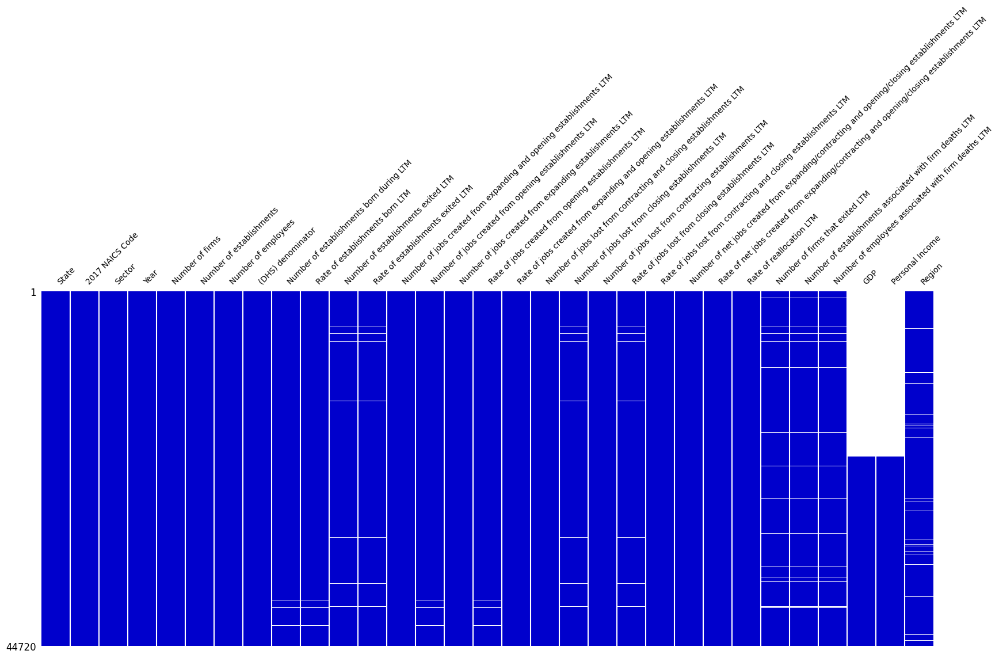

In [32]:
sorted_df_merged = df_merged.sort_values(by="Year")
sorted_df_merged = sorted_df_merged.drop(columns=["Meaning of Establishments located in Metropolitan or Micropolitan Statistical Area indicator"])
sorted_df_merged.columns = ['State', '2017 NAICS Code', 'Sector', "Year", "Number of firms", "Number of establishments", "Number of employees","(DHS) denominator", "Number of establishments born during LTM", "Rate of establishments born LTM",
"Number of establishments exited LTM", "Rate of establishments exited LTM", "Number of jobs created from expanding and opening establishments LTM", "Number of jobs created from opening establishments LTM",
"Number of jobs created from expanding establishments LTM","Rate of jobs created from opening establishments LTM", "Rate of jobs created from expanding and opening establishments LTM",
"Number of jobs lost from contracting and closing establishments LTM", "Number of jobs lost from closing establishments LTM", "Number of jobs lost from contracting establishments LTM",
"Rate of jobs lost from closing establishments LTM", "Rate of jobs lost from contracting and closing establishments LTM", "Number of net jobs created from expanding/contracting and opening/closing establishments LTM",
"Rate of net jobs created from expanding/contracting and opening/closing establishments LTM", "Rate of reallocation LTM", "Number of firms that exited LTM","Number of establishments associated with firm deaths LTM",
"Number of employees associated with firm deaths LTM", "GDP", "Personal Income", "Region"]
msno.matrix(sorted_df_merged, n=1, p=1, figsize=(20, 8), fontsize=10, width_ratios=(10, 1), sort=None, filter=None, sparkline=False, color=(0, 0, 0.8))
plt.show()

**Deeper Analysis of the Matrix: Noteworthy Insights**

Upon conducting a meticulous review of the matrix provided, a conspicuous pattern emerges that there is a considerable number of missing values within both the GDP and Personal Income columns. It is reasonable to infer that there are gaps in the data for these specific parameters spanning multiple years. As a result, it would be advisable to initiate data exploration from the years where complete datasets are available, ensuring more meaningful and accurate analysis.

#**5. Data Exploration**

## 5.1 Trend of GDP over the time across States between 2000 and 2020

Moving forward with our analysis, we'll try to see which states have notable improvement in GDP relatively and try to answer the following question.

**Question - Which states have seen a noticible improvement in GDP between the years 2000 and 2020?**

In [26]:
#Loading the geojson file
geojson_url = 'https://github.com/ltrucios/BA780_GroupAssigment_Group09/raw/main/Datasets/us-states.json'

#Reference from ChatGPT
# Fetch the GeoJSON data from the URL
response = requests.get(geojson_url)
us_states = response.json()

# Filter your DataFrame and convert 'Year' to a string
filtered_data = df_merged.copy()
filtered_data = filtered_data[(filtered_data["Geographic Area Name"] != "United States") &
                             (filtered_data["Meaning of NAICS Code"] != "Total for all sectors") &
                          (filtered_data["Year"] >= 2000)]

filtered_data.loc[:, 'Year'] = filtered_data['Year'].astype(str)

# Converts geographic area names into corresponding codes for importing
state_region_map = {
      "Alabama":"AL","Alaska":"AK","Arizona":"AZ","Arkansas":"AR","California":"CA","Colorado":"CO","Connecticut":"CT","Delaware":"DE","Washington DC":"DC","Florida":"FL","Georgia":"GA","Hawaii":"HI","Idaho":"ID",
      "Illinois":"IL","Indiana":"IN","Iowa":"IA","Kansas":"KS","Kentucky":"KY","Louisiana":"LA","Maine":"ME","Maryland":"MD","Massachusetts":"MA","Michigan":"MI","Minnesota":"MN","Mississippi":"MS","Missouri":"MO",
      "Montana":"MT","Nebraska":"NE","Nevada":"NV","New Hampshire":"NH","New Jersey":"NJ","New Mexico":"NM","New York":"NY","North Carolina":"NC","North Dakota":"ND","Ohio":"OH","Oklahoma":"OK","Oregon":"OR",
      "Pennsylvania":"PA","Rhode Island":"RI","South Carolina":"SC","South Dakota":"SD","Tennessee":"TN","Texas":"TX","Utah":"UT","Vermont":"VT","Virginia":"VA","Washington":"WA","West Virginia":"WV",
      "Wisconsin":"WI","Wyoming":"WY"}
filtered_data['Geographic Area Name']=filtered_data['Geographic Area Name'].replace(state_region_map)

#Reference from ChatGPT
# Create the choropleth map
fig = px.choropleth(
    filtered_data,
    locations="Geographic Area Name",
    locationmode="USA-states",
    geojson=us_states,
    color="GDP",
    scope="usa",  # Map scope (USA)
    hover_name="Geographic Area Name",
    color_continuous_scale="Blues",
    title="Figure 5.1: State-wise GDP",
    range_color=[0, 1000000],
    animation_frame='Year'
);

fig.update_coloraxes(colorbar_title="GDP (USD Trillion)")
fig.show();


**Two Decades of Economic Trends: Examining Leading States**

A comprehensive analysis spanning two decades leads to the conclusion that New York, California, Texas, and Florida consistently maintain the highest GDP. Of particular significance is the remarkable growth experienced by Florida, with an impressive nearly 100% increase in GDP since 1998.


## 5.2 Trend of Per Capita Personal Income over the time across States between 2000 and 2020

In [27]:
#Loading the geojson file
geojson_url = 'https://github.com/ltrucios/BA780_GroupAssigment_Group09/raw/main/Datasets/us-states.json'

#Reference from ChatGPT
# Fetch the GeoJSON data from the URL
response = requests.get(geojson_url)
us_states = response.json()

# Filter your DataFrame and convert 'Year' to a string
filtered_data = df_merged.copy()
filtered_data = filtered_data[(filtered_data["Geographic Area Name"] != "United States") &
                              (filtered_data["Year"] >= 2000)]

filtered_data.loc[:, 'Year'] = filtered_data['Year'].astype(str)
filtered_data.loc[:, 'Geographic Area Name'] = filtered_data['Geographic Area Name'].replace(state_region_map)

# Converts geographic area names into corresponding codes for importing
state_region_map = {
    "Alabama":"AL","Alaska":"AK","Arizona":"AZ","Arkansas":"AR","California":"CA","Colorado":"CO","Connecticut":"CT","Delaware":"DE","Washington DC":"DC","Florida":"FL","Georgia":"GA","Hawaii":"HI","Idaho":"ID",
    "Illinois":"IL","Indiana":"IN","Iowa":"IA","Kansas":"KS","Kentucky":"KY","Louisiana":"LA","Maine":"ME","Maryland":"MD","Massachusetts":"MA","Michigan":"MI","Minnesota":"MN","Mississippi":"MS","Missouri":"MO",
    "Montana":"MT","Nebraska":"NE","Nevada":"NV","New Hampshire":"NH","New Jersey":"NJ","New Mexico":"NM","New York":"NY","North Carolina":"NC","North Dakota":"ND","Ohio":"OH","Oklahoma":"OK","Oregon":"OR",
    "Pennsylvania":"PA","Rhode Island":"RI","South Carolina":"SC","South Dakota":"SD","Tennessee":"TN","Texas":"TX","Utah":"UT","Vermont":"VT","Virginia":"VA","Washington":"WA","West Virginia":"WV",
    "Wisconsin":"WI","Wyoming":"WY"}
filtered_data['Geographic Area Name']=filtered_data['Geographic Area Name'].replace(state_region_map)

#Reference from ChatGPT
# Create the choropleth map
fig = px.choropleth(
    filtered_data,
    locations="Geographic Area Name",
    locationmode="USA-states",
    geojson=us_states,
    color="Per capita personal income",
    scope="usa",  # Map scope (USA)
    hover_name="Geographic Area Name",
    color_continuous_scale="Blues",
    title="Figure 5.2: State-wise Per Capita Personal Income",
    range_color=[10000, 70000],
    animation_frame='Year'
)

fig.update_coloraxes(colorbar_title="Per Capita Personal Income (USD)")
fig.show()

**Charting Two Decades of Economic Growth: A Regional Perspective**

The map above provides a comprehensive view of a 20-year period, illustrating remarkable increases in Per Capita Personal Income across several states. Notably, states such as Washington, California, New York, New Hampshire, New Jersey, Massachusetts, and Connecticut have exhibited substantial growth in this economic metric. Massachusetts, in particular, stands out with the highest Per Capita Personal Income, peaking at approximately $78.69k

## 5.3 Trend of Per Capita Personal Income over the time across regions between 2000 and 2020

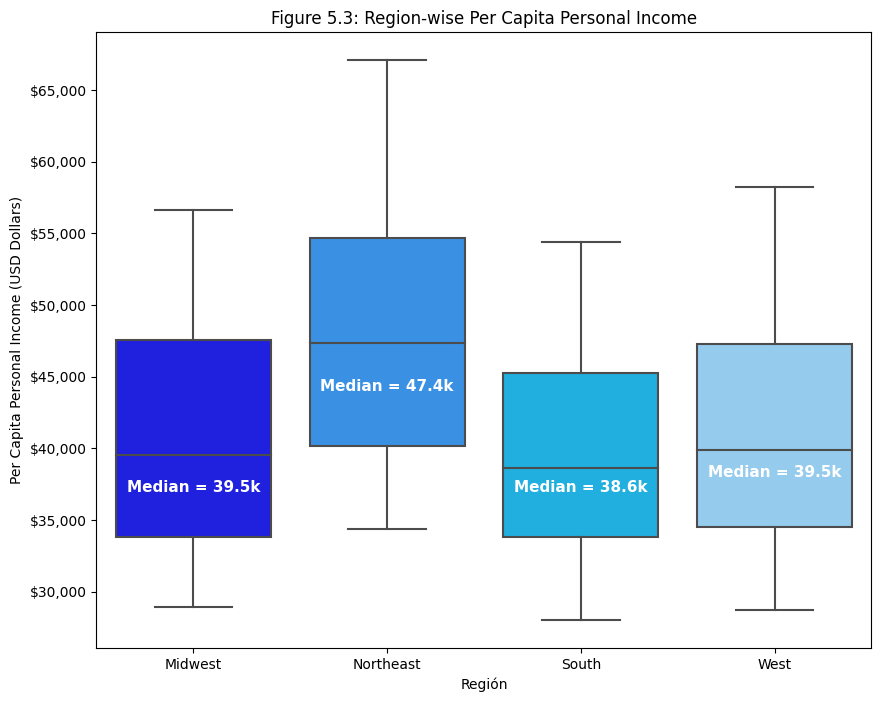

In [33]:
# Filtered data excluding "United States", total NAICS and years before 2000
income_data = df_merged[
    (df_merged["Geographic Area Name"] != "United States") &
    (df_merged["Meaning of NAICS Code"] != "Total for all sectors") &
    (df_merged["Year"] >= 2000)];
income_data = income_data.groupby(["Region", "Year"]).mean(numeric_only=True)
income_data['Per capita personal income'] = income_data['Per capita personal income'];
income_data = income_data.reset_index();

#Figure size settings
plt.figure(figsize=(10, 8))

#Definition of a blue color palette
palette = ['#0000FF', '#1E90FF', '#00BFFF', '#87CEFA', '#6495ED']

#Creating a boxplot using Seaborn with the defined color palette
sns.boxplot(x='Region', y='Per capita personal income', data=income_data, palette=palette)
plt.title('Figure 5.3: Region-wise Per Capita Personal Income')
plt.xlabel('Región')
plt.ylabel('Per Capita Personal Income (USD Dollars)');
formatter = mticker.StrMethodFormatter('${x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter);

#Adding labels to indicate medians in each region
plt.text(x=0, y=37000, s='Median = 39.5k', fontsize=11, ha='center', color="white", weight = "bold")
plt.text(x=1, y=44000, s='Median = 47.4k', fontsize=11, ha='center', color="white", weight = "bold")
plt.text(x=2, y=37000, s='Median = 38.6k', fontsize=11, ha='center', color="white", weight = "bold")
plt.text(x=3, y=38000, s='Median = 39.5k', fontsize=11, ha='center', color="white", weight = "bold");

**Box Plot Insights: Regional Per Capita Personal Income**

A thorough analysis of the presented box plot unveils compelling insights. Notably, the NorthEast Region stands out with the highest Per Capita Personal Income, showcasing a noteworthy median value of USD 47.4k. Furthermore, the Midwest and West regions demonstrate commendable performance in this metric, with their respective median incomes hovering around USD 39.5k.

## 5.4 Distribution of Firms by Regions over the years between 2000 and 2020

In [34]:
# Filter data for years 2000 to 2020
filtered_df = df_merged[(df_merged['Year'] >= 2000) & (df_merged['Year'] <= 2020)]

# Handle duplicates by aggregating (e.g., calculating the mean)
pivot_table = filtered_df.groupby(['Region', 'Year'])['Number of firms'].sum().unstack()

# Get the unique years from the pivot table
years = pivot_table.columns

# Convert years to strings
year_strings = [str(year) for year in years]

# Create frames for the animation
frames = [go.Frame(
    data=[
        go.Pie(
            labels=pivot_table.index,
            values=pivot_table[year],
            title=f'Year {year}',
            legendgroup='Firms by Region',
            name=year_str
        )
    ]
) for year, year_str in zip(years, year_strings)]

blues_palette = ['#0000FF', '#1E90FF', '#00BFFF', '#87CEFA', '#6495ED']


# Create the figure
fig = go.Figure(data=[
    go.Pie(
        labels=pivot_table.index,
        values=pivot_table[years[0]],
        title=f'Year {years[0]}',
        legendgroup='Firms by Region',
        name=year_strings[0],
        marker=dict(colors=blues_palette)
    )
], frames=frames)

# Define animation settings
animation_settings = dict(frame=dict(duration=1000, redraw=True), fromcurrent=True)

# Add animation buttons
fig.update_layout(updatemenus=[dict(type='buttons', showactive=False, buttons=[dict(label='Play', method='animate', args=[None, animation_settings])])])

fig.update_layout(title='Figure 5.4: Distribution of Firms by Regions over the years between 2000 and 2020')
fig.update_layout(showlegend=True)  # Show the legend

# Display the animated pie chart
fig.show()

**Insights from the Pie Chart: Firms by Region**

The pie chart depicted above confirms a notable observation: the region with the highest number of firms is the South, despite having the lowest Per Capita Personal Income. This observation suggests several intriguing dynamics. It implies that the South is a region experiencing growth, potentially fueled by other economic factors, such as the robust GDP of Texas, which is situated within the Southern region.

## 5.5 Employees Market Share across Regions

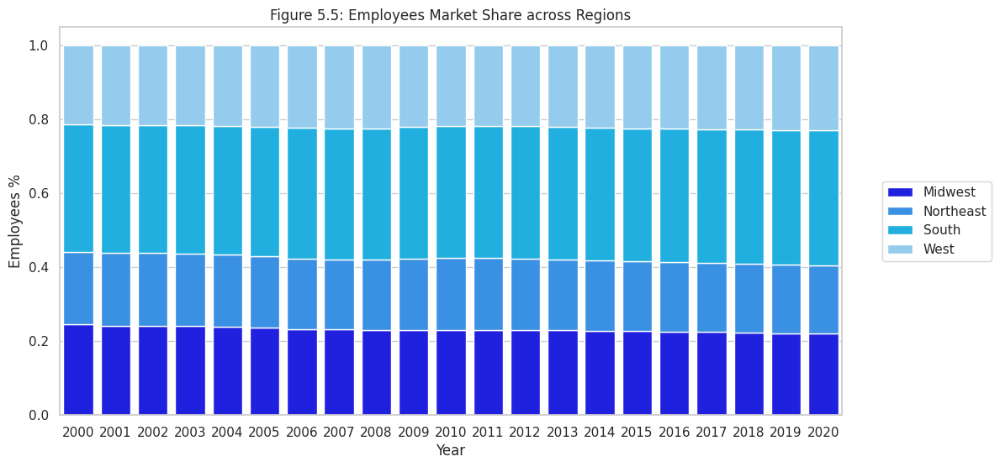

In [35]:
# Subset of Dataset
regions_data_2 = df_merged[
    (df_merged["Geographic Area Name"] != "United States") &
    (df_merged["Meaning of NAICS Code"] != "Total for all sectors") &
    (df_merged["Year"] >= 2000)]
regions_data_2 = regions_data_2.groupby([ "Year", "Region"])["Number of employees"].sum()
regions_data_2 = pd.DataFrame(regions_data_2)
regions_data_2.reset_index()
regions_data_2['Employees_sum'] = regions_data_2.groupby('Year')['Number of employees'].transform('sum')
regions_data_2['Employees_%'] = regions_data_2["Number of employees"]/regions_data_2["Employees_sum"]
regions_data_2 = regions_data_2.reset_index()

# Figure Style and Size Settings
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))

# Filter and reset the indexes for each region
regions_data_2_Midwest = regions_data_2[regions_data_2["Region"] == "Midwest"].reset_index()
regions_data_2_Northeast = regions_data_2[regions_data_2["Region"] == "Northeast"].reset_index()
regions_data_2_South = regions_data_2[regions_data_2["Region"] == "South"].reset_index()
regions_data_2_West = regions_data_2[regions_data_2["Region"] == "West"].reset_index()

# Calculates cumulative values ​​for stacked bars
bottom_values_northeast = regions_data_2_Midwest["Employees_%"].values
bottom_values_south = bottom_values_northeast + regions_data_2_Northeast["Employees_%"].values
bottom_values_west = bottom_values_south + regions_data_2_South["Employees_%"].values

# Create the stacked bar chart
sns.barplot(x='Year', y="Employees_%", data=regions_data_2_Midwest, color='#0000FF', label='Midwest')
sns.barplot(x='Year', y="Employees_%", data=regions_data_2_Northeast, color='#1E90FF', label='Northeast', bottom=bottom_values_northeast)
sns.barplot(x='Year', y="Employees_%", data=regions_data_2_South, color='#00BFFF', label='South', bottom=bottom_values_south)
sns.barplot(x='Year', y="Employees_%", data=regions_data_2_West, color='#87CEFA', label='West', bottom=bottom_values_west)

# Customize the chart
plt.title('Figure 5.5: Employees Market Share across Regions')
plt.xlabel('Year')
plt.ylabel("Employees %")
plt.legend(loc='center right', bbox_to_anchor=(1.2, 0.5))

# Show the graph
plt.show()

**Deciphering the Stacked Bar Chart: Employee Market Share by Region**

A detailed analysis of the stacked bar chart yields a compelling revelation: the South region stands as the dominant leader in terms of Employee Market Share among all regions. This trend aligns with expectations, considering the South's robust economic growth and commendable GDP performance. This observation underscores the South's prominence in the job market, highlighting the region's economic vitality and employment opportunities.

## 5.6 Trend Analysis


Moving forward with the Analysis
we'll first try to plot charts to observe the corelation between important columns(Net Jobs Created, Real GDP, Number of Firms and Number of Employees) within the years 2000-2020.

With this approach we'll try to answer the following question.

**Question - What has been the behaviour of the Job Trends and Economy between 2000 and 2020 in the US?**

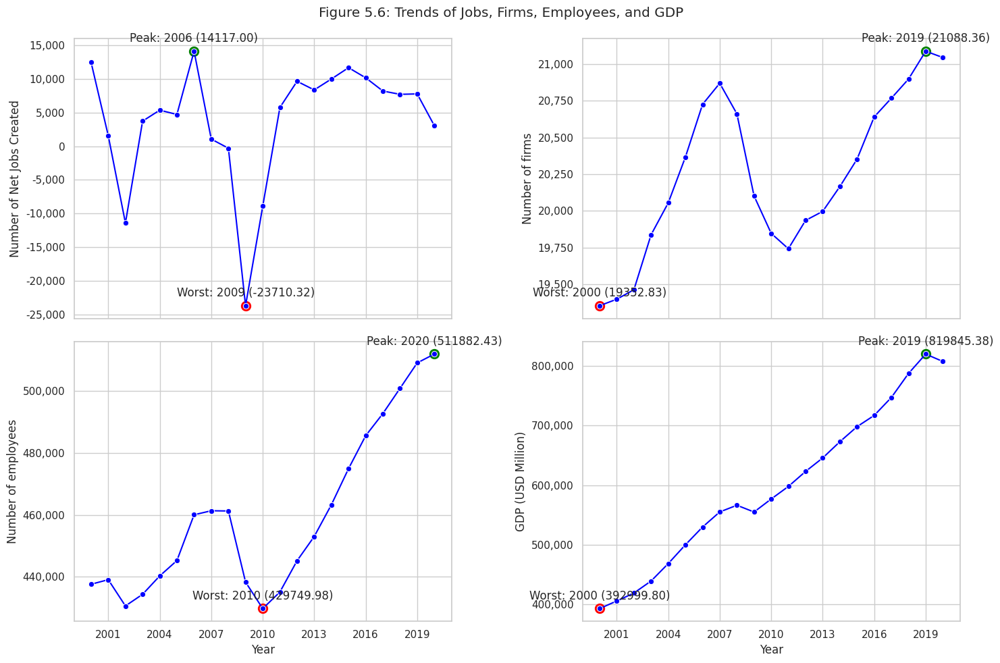

In [36]:
# Choosing the years from 2000 to 2020
year_00_20 = df_merged[(df_merged["Year"] >= 2000) & (df_merged["Year"] <= 2020)]

# Plotting the trend of net jobs, number of firms, number of employees, and the Real GDP against the 20 years
fig, axes = plt.subplots(2, 2, sharex=True, figsize=(15, 10))
fig.suptitle('Figure 5.6: Trends of Jobs, Firms, Employees, and GDP')

sns.set_style('whitegrid')

# Plotting the data for each subplot
sns.lineplot(ax=axes[0][0], x='Year', y='Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months', data=year_00_20, color="blue", errorbar=None, marker='o')
axes[0][0].set_ylabel('Number of Net Jobs Created')
axes[0][0].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

sns.lineplot(ax=axes[0][1], x='Year', y='Number of firms', data=year_00_20, errorbar=None, marker='o', color="blue")
axes[0][1].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

sns.lineplot(ax=axes[1][0], x='Year', y='Number of employees', data=year_00_20, errorbar=None, marker='o', color="blue")
axes[1][0].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

sns.lineplot(ax=axes[1][1], x='Year', y='GDP', data=year_00_20, errorbar=None, marker='o',color="blue")
axes[1][1].set_ylabel('GDP (USD Million)')
axes[1][1].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))


# Reference from ChatGPT
# Finding the peak and worst years for each subplot
for ax in axes.flat:
    data = ax.get_lines()[0].get_data()
    peak_idx = data[1].argmax()
    worst_idx = data[1].argmin()
    peak_year = int(data[0][peak_idx])
    peak_value = data[1][peak_idx]
    worst_year = int(data[0][worst_idx])
    worst_value = data[1][worst_idx]

    # Highlighting the peak and worst years with larger green and red dots
    ax.scatter(peak_year, peak_value, color='green', s=100)
    ax.scatter(worst_year, worst_value, color='red', s=100)
    ax.annotate(f'Peak: {peak_year} ({peak_value:.2f})', (peak_year, peak_value), textcoords="offset points", xytext=(0,10), ha='center')
    ax.annotate(f'Worst: {worst_year} ({worst_value:.2f})', (worst_year, worst_value), textcoords="offset points", xytext=(0,10), ha='center')

# Reference from ChatGPT
# Formating x-axis labels
for ax in axes.flat:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

# Displaying the plot
plt.tight_layout()
plt.show()

**Insights from the subplots**

From the subplots we find that there is a sharp dip in the years from 2008-2010 which is consistent with the 2008 Recession in the US.

The first impact of the recession was on the firms followed by the jobs and other metrics.


# **Summary of Insights from Exploration**

1. **GDP** - The GDP has grown across the years in the US. States  - California, Newyork, Texas and Florida stand-out as leading congtributors to the GDP of the United States, across the years (2000 to 2020)

2. **Personal Income Per Capita** - The variance of income across the years over the states tells us that while all states have seen an improvement over two decades. States - Massachusets, Connecticut, NewYork and New Jersey are thriving with highest per capita incomes ranging b/w **~72K - ~78K USD**. Also looking at the trends across regions,  we see that Northeast Region has a higher range implying that per capita income can be considered higher with a median income as **47K USD** across the last 2 decades.

3. **Distribution of Firms and Employees across Regions** - The interactive Pie Chart and Stacked Bar Chart helps us understand how number of firms and employees have varied across years. In relative terms, South has highest number of firms and employees and there's a steady increase over the years.

4. **Trends of Jobs, GDP, Employees and Firms across years(2000-2020)** - Plotting these variables across the years gives us an understanding of what's the impact of time on these metrics. This helps us pick incidents and events and explore further. We could observe a sharp dip for all the metrics in 2008-2010 time frame.

5. **Grouping Industries into Categories** - For analysis purposes we have created four indsutry categories regarding similar characteristics. This allows us to understand findings across sectors.

>> **Primary Industries:**
* Agriculture, Forestry, Fishing, and Hunting
* Mining, Quarrying, and Oil and Gas Extraction
* Utilities

>> **Production and Manufacturing:**
* Construction
* Manufacturing

>> **Services and Technology:**
* Wholesale Trade
* Retail Trade
* Transportation and Warehousing
* Information
* Finance and Insurance
* Health Care and Social Assistance

>> **Other Services:**
* Real Estate and Rental and Leasing
* Professional, Scientific, and Technical Services
* Management of Companies and Enterprises
* Administrative and Support and Waste Management and Remediation Services
* Educational Services
* Arts, Entertainment, and Recreation
* Accommodation and Food Services
* Other Services (Except Public Administration)









**Moving forward with there learnings we'll now delve deeper into certain aspects such as Volatailty of Jobs, Economic events, GDP and Firms correlation.**

# **6. Identifying the Sectors with highest and lowest Employment Volatility**



## 6.1 Volatility across Sectors


We're keen to see how the death of firms has affected the GDP on a highlevel. So by the end of this analysis we'll try to answer the following question

**Question - Which sectors were the least and most volatile in terms of jobs across the years?**
In other terms, which sectors were least and most affected by the recession.

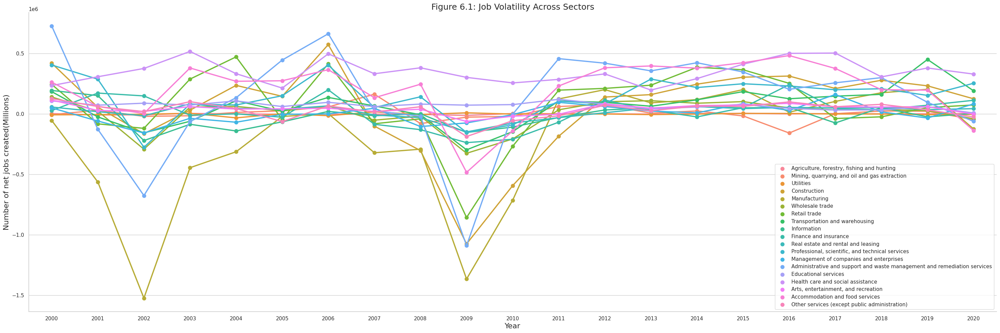

In [37]:
# Filtering data for the years 2000 to 2020
year_00_20 = df_merged[(df_merged["Year"]>=2000)&(df_merged["Year"]<=2020)]

# Filtering data for the United States
df_jobs_effect=year_00_20[year_00_20["Geographic Area Name"] == "United States"]
df_jobs_effect=df_jobs_effect[df_jobs_effect['Meaning of NAICS Code']!='Total for all sectors']
df_jobs_effect_srt=df_jobs_effect.sort_values(by='Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months', ascending = False)


# Creating a categorical plot using Seaborn
fig=sns.catplot(x='Year',
                y='Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months',
                data=df_jobs_effect,
                hue='Meaning of NAICS Code',
                kind='point', height=10,
                aspect=3,errorbar=None, legend=False);

# Customizing x and y axis labels and plot title
plt.xlabel('Year', fontsize=16)
plt.ylabel('Number of net jobs created(Millions)', fontsize=16)
plt.title("Figure 6.1: Job Volatility Across Sectors", fontsize=18)
fig.ax.legend(title="Sectors", fontsize=12, title_fontsize=14)
plt.legend(loc="lower right", bbox_to_anchor=(1,0));

**Unveiling Employment Volatility During Recessions**

Our analysis reveals a noteworthy pattern of employment volatility during recessions. Notably, the **Manufacturing sector** experiences the highest degree of fluctuation, closely followed by **Administrative and support sector**.

It is evident that multiple sectors exhibit discernible volatility trends. However, the current graph's complexity hinders clarity, with its intricate lines causing readability issues. To enhance comprehension, we intend to generate a bar plot displaying standard deviations, offering a more coherent and insightful perspective on employment stability across sectors.

## 6.2 Identifying the Sectors with highest and lowest Employment Volatility

Here we're plotting the volatility on a barplot for better visualization

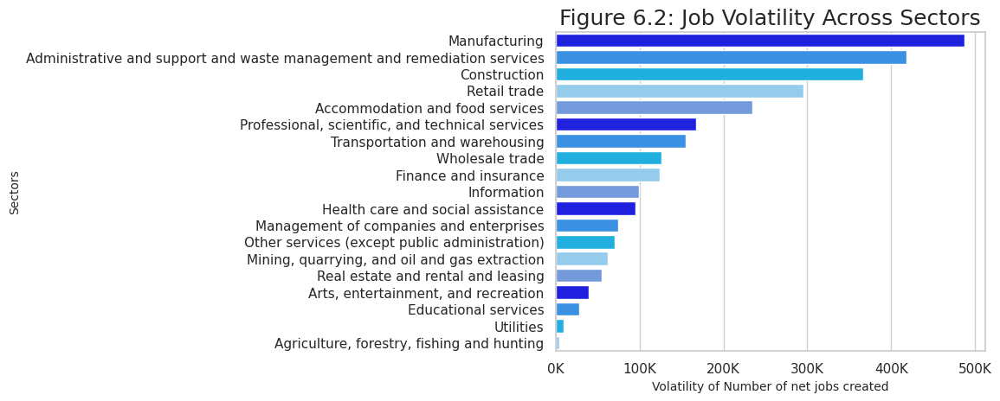

In [38]:
# Filtering data
df_volatility = year_00_20[year_00_20["Geographic Area Name"] == "United States"]
df_volatility = df_volatility[df_volatility["Meaning of NAICS Code"] != "Total for all sectors"]

# Grouping data by 'Meaning of NAICS Code' and calculating the standard deviation of job volatility for each sector
df_volatility = df_volatility.groupby(["Meaning of NAICS Code"])["Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months"].std()
df_volatility = pd.DataFrame({"Volatility":df_volatility})
df_volatility.reset_index(inplace = True)
df_volatility_by_sector=df_volatility.sort_values(by='Volatility', ascending=True)

# Defining a blues color palette
blues_palette = ['#0000FF', '#1E90FF', '#00BFFF', '#87CEFA', '#6495ED']
df_volatility_by_sector = df_volatility_by_sector.sort_values(by='Volatility', ascending=False)
fig1 = sns.barplot(y="Meaning of NAICS Code", x="Volatility", data=df_volatility_by_sector, orient="h", palette=blues_palette)

# Customizing the y-axis labels and their rotation
fig1.set_yticklabels(df_volatility_by_sector["Meaning of NAICS Code"], rotation=0)
def format_thousands(x, pos):
    return '{:,.0f}K'.format(x / 1000)


# Applying the custom formatting function to the x-axis
formatter = FuncFormatter(format_thousands)
fig1.xaxis.set_major_formatter(formatter)

# Setting labels for the x and y axes and the plot title
plt.xlabel('Volatility of Number of net jobs created', fontsize=10)
plt.ylabel('Sectors', fontsize=10)
plt.title("Figure 6.2: Job Volatility Across Sectors", fontsize=18)

plt.show()

**Insights from the Bar Plot**

The clarity of this graph offers a concise view of the volatility within each sector during the recession.

Answering the critical question - it becomes evident that the Agriculture, Utilities, and Real Estate Sectors experienced the least impact, while the Administrative, Manufacturing, and Construction sectors were significantly affected by the recession.

Specifically, the construction sector stands out as one of the hardest-hit areas during the economic downturn. This observation aligns with findings reported by CNBC, which further validates the extent of the recession's impact on this sector. For more information, refer to the CNBC report at link.
https://www.cnbc.com/2012/06/01/Industries-Hit-Hardest-by-the-Recession.html

## 6.3 Understanding the Rate of Unemployment against the Volatility of Jobs across industries

Here we'll explore how the top 5 volatile sectors are distributed in terms of rate of unemployment and volatality

In [39]:
# Creating a new Dataframe with the Top 5 Volatile Sector
year_00_20 = df_merged[(df_merged["Year"]>=2000)&(df_merged["Year"]<=2020)]

# Dropping the United States total variable
new_df_top_1 = year_00_20[year_00_20["Geographic Area Name"] == "United States"]
new_df_top_2 = year_00_20[year_00_20["Geographic Area Name"] == "United States"]
new_df_top_3 = year_00_20[year_00_20["Geographic Area Name"] == "United States"]
new_df_top_4 = year_00_20[year_00_20["Geographic Area Name"] == "United States"]
new_df_top_5 = year_00_20[year_00_20["Geographic Area Name"] == "United States"]

# Creating a New Dataframe with the Top 5 Sectors respectively
new_df_top_1 = new_df_top_1[new_df_top_1['Meaning of NAICS Code'] == 'Manufacturing']
new_df_top_2 = new_df_top_2[new_df_top_2['Meaning of NAICS Code'] == 'Administrative and support and waste management and remediation services']
new_df_top_3 = new_df_top_3[new_df_top_3['Meaning of NAICS Code'] == 'Construction']
new_df_top_4 = new_df_top_4[new_df_top_4['Meaning of NAICS Code'] == 'Retail trade']
new_df_top_5 = new_df_top_5[new_df_top_5['Meaning of NAICS Code'] == 'Health care and social assistance']

# Calculating total No. of employees
total_no_of_employees_1 = new_df_top_1['Number of employees'].sum()
total_no_of_employees_2 = new_df_top_2['Number of employees'].sum()
total_no_of_employees_3 = new_df_top_3['Number of employees'].sum()
total_no_of_employees_4 = new_df_top_4['Number of employees'].sum()
total_no_of_employees_5 = new_df_top_5['Number of employees'].sum()

# Finding and creating a new column of the Rate of Unemployement within the top 5 volatile sectors
new_df_top_1['Percent_of_employee'] = (new_df_top_1['Number of employees associated with firm deaths during the last 12 months'] / total_no_of_employees_1)*100
new_df_top_2['Percent_of_employee'] = (new_df_top_2['Number of employees associated with firm deaths during the last 12 months'] / total_no_of_employees_2)*100
new_df_top_3['Percent_of_employee'] = (new_df_top_3['Number of employees associated with firm deaths during the last 12 months'] / total_no_of_employees_3)*100
new_df_top_4['Percent_of_employee'] = (new_df_top_4['Number of employees associated with firm deaths during the last 12 months'] / total_no_of_employees_4)*100
new_df_top_5['Percent_of_employee'] = (new_df_top_5['Number of employees associated with firm deaths during the last 12 months'] / total_no_of_employees_5)*100

# Calculating and creating a new column of the Volatility of the number of net jobs created from expanding/contracting and opening/closing establishments by Standard Deviation
new_df_top_1['Volatility'] = new_df_top_1["Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months"].std()
new_df_top_2['Volatility'] = new_df_top_2["Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months"].std()
new_df_top_3['Volatility'] = new_df_top_3["Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months"].std()
new_df_top_4['Volatility'] = new_df_top_4["Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months"].std()
new_df_top_5['Volatility'] = new_df_top_5["Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months"].std()

# Creating a bokeh figure
fig = figure(x_axis_label = 'Volatility', y_axis_label = 'Rate of unemployment', title = 'Figure 6.2: Rate of Unemployment vs Volatility')

fig.xaxis.formatter = NumeralTickFormatter(format="0a")

# Plotting the graphs
fig.circle(x='Volatility', y='Percent_of_employee', source=new_df_top_1, color='midnightblue', legend_label = 'Manufacturing')
fig.circle(x='Volatility', y='Percent_of_employee', source=new_df_top_2, color='mediumblue', legend_label = 'Administrative and support and waste management and remediation services')
fig.circle(x='Volatility', y='Percent_of_employee', source=new_df_top_3, color='steelblue', legend_label = 'Construction')
fig.circle(x='Volatility', y='Percent_of_employee', source=new_df_top_4, color='lightskyblue', legend_label = 'Reatil trade')
fig.circle(x='Volatility', y='Percent_of_employee', source=new_df_top_5, color='lightsteelblue', legend_label = 'Health care and social assistance')
output_file(filename = 'rate of Unemployment vs volatility.html')
show(fig)

Observing the scatter graph, it becomes evident that while Manufacturing exhibits the highest volatility, the Construction sector experiences a more significant rate of unemployment attributable to firm closures. The Construction sector faced the highest rate of unemployment and death firms due to the following factors:-

* Capital Constraints: Difficulties in accessing credit and funding for construction projects can delay or cancel planned construction, leading to job losses.
* Decreased Consumer and Business Spending: Reduced consumer and business spending during recessions can deter new construction projects, causing unemployment in the sector.
* Global Economic Factors: International trade and supply chain disruptions can affect the cost and availability of construction materials, impacting the sector.

This observation aligns with findings according to this report by American Progress, which further validates the extent of the recession's impact on this sector. For more information, refer to the report at link.
https://www.americanprogress.org/article/taking-on-the-tool-belt-recession/

# **7. Studying the effect of Economic Events on Jobs across Sectors**

## 7.1 Identifying the correlation between Rate of net jobs created and the change of GDP over the years

We're keen to see how various Job Sectors were affected my economic events in the last couple of decades. From the exploratory analysis, we could observe that there are sharp dips in the time period 2008 - 2010. We'd want to go deeper and understand how different job and firm metrics were affected in this period across sectors

So by the end of this analysis we'll try to answer the following question.

**Question - Which states have taken a larger hit due to economic events?**

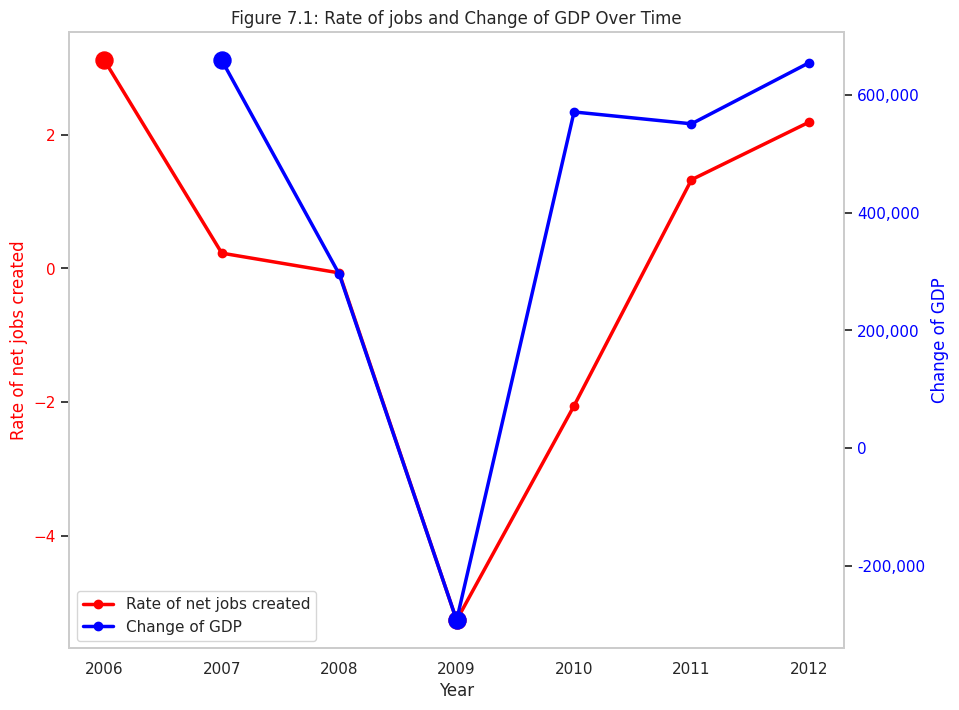

In [40]:
#Subsetting years from 2000 to 2015 for our analysis of economic events impact over jobs
df_merged_us = df_merged[(df_merged["Year"]>=2006)&(df_merged["Year"]<=2012)]

#Filtering for analysis over United States and over all the sectors for high level analysis
df_merged_us = df_merged_us[df_merged_us["Geographic Area Name"] == "United States"]
df_merged_us = df_merged_us[df_merged_us["Meaning of NAICS Code"] == "Total for all sectors"]

#Creating a new df with the change of GDP in the consecutive years as the value
df_merged_us_gdp_diff=df_merged_us['GDP'].diff()


# Sample data for Rate of net jobs created and GDP
years = df_merged_us['Year']
firm_deaths = df_merged_us['Rate of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months']
gdp = df_merged_us_gdp_diff


# Ploting Number of Rate of net jobs created from expanding/contracting and opening/closing establishments
fig, ax1 = plt.subplots(figsize=(10, 8))
ax1.set_xlabel('Year')
ax1.set_ylabel('Rate of net jobs created', color='red')
ax1.plot(years, firm_deaths, color='red', marker='o', label='Rate of net jobs created', linewidth=2.5)
ax1.tick_params(axis='y', labelcolor='red')


# Plotting second y-axis for GDP
ax2 = ax1.twinx()
ax2.set_ylabel('Change of GDP', color='blue')
ax2.plot(years, gdp, color='blue', marker='o', label='Change of GDP', linewidth=2.5)
ax2.tick_params(axis='y', labelcolor='blue')


lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='lower left')

# Add a title and labels
plt.title('Figure 7.1: Rate of jobs and Change of GDP Over Time')
plt.xlabel('Year')

# Find the peak year for job creation
peak_year_jobs = years[firm_deaths.idxmax()]
peak_value_jobs = firm_deaths.max()

# Find the worst year for job creation
worst_year_jobs = years[firm_deaths.idxmin()]
worst_value_jobs = firm_deaths.min()


ax1.scatter(peak_year_jobs, peak_value_jobs, color='red', marker='o', label=f'Peak Year (Jobs): {peak_year_jobs}', s=150, zorder=3)
ax1.scatter(worst_year_jobs, worst_value_jobs, color='red', marker='o', label=f'Worst Year (Jobs): {worst_year_jobs}', s=150, zorder=3)


# Find the peak year for GDP
peak_year_gdp= years[gdp.idxmax()]
peak_value_gdp = gdp.max()

# Find the worst year for GDP
worst_year_gdp= years[gdp.idxmin()]
worst_value_gdp = gdp.min()

ax2.scatter(peak_year_gdp, peak_value_gdp, color='blue', marker='o', label=f'Peak Year (GDP): {peak_year_gdp}', s=150, zorder=3)
ax2.scatter(worst_year_gdp, worst_value_gdp, color='blue', marker='o', label=f'Worst Year (GDP): {worst_year_gdp}', s=150, zorder=3)

ax1.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
ax1.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))
ax2.get_yaxis().set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))


# Display the plot
ax1.grid(False)
ax2.grid(False)
plt.show();


The Figure 7.1 reveals a profound and significant correlation between the rate of jobs created and changes in GDP over the years 2006 to 2012. This relationship underscores the powerful interplay between employment and economic growth.
However, the graph notably showcases a pivotal moment in 2009, marked by a stark dip in both job creation and GDP changes. This dip can be attributed to the severe economic recession that had a profound impact on the United States and had ripple effects worldwide.

## 7.2 Top States with highest job losses during 2008 recession

Since we've reaffirmed that the GDP and Jobs hit a bottom in the recession period, we'll now try to see which states took the biggest.

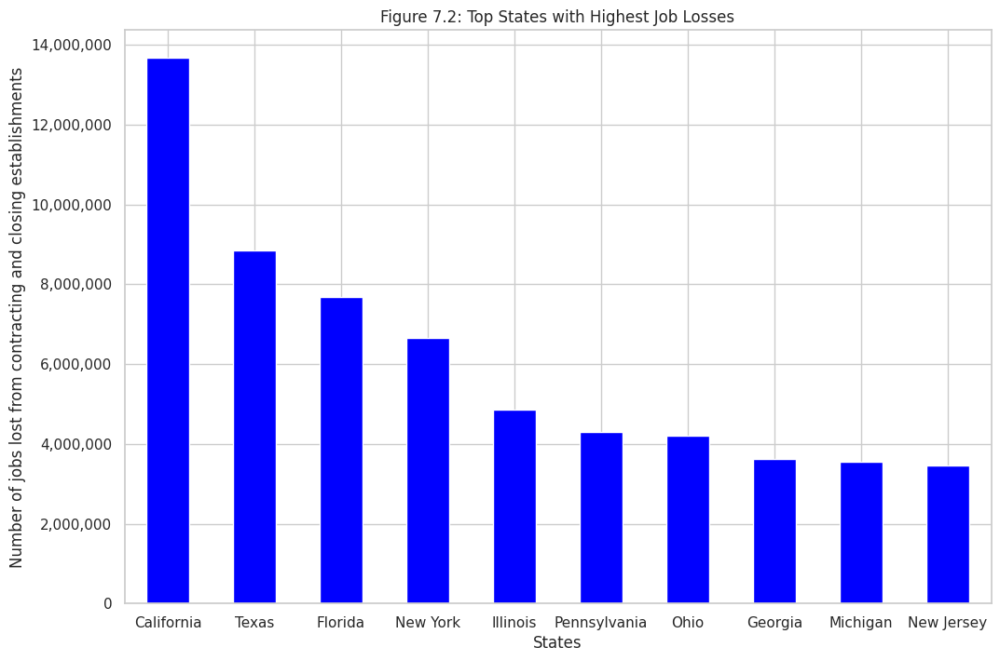

In [41]:
# Copy of the original DataFrame to avoid modifying the original data
job_loss_state = df_merged.copy()

# Filtered data for the years 2006 to 2012, excluding "United States" and "Total for all sectors"
job_loss_state = job_loss_state[(job_loss_state["Year"] >= 2006) & (job_loss_state["Year"] <= 2012)]
job_loss_state = job_loss_state[job_loss_state["Geographic Area Name"] != "United States"]
job_loss_state = job_loss_state[job_loss_state["Meaning of NAICS Code"] != "Total for all sectors"]

# Grouping by state and year, adding the number of jobs lost due to the closure of establishments
state_job_losses = job_loss_state.groupby(['Geographic Area Name', 'Year'])['Number of jobs lost from contracting and closing establishments during the last 12 months'].sum().reset_index()

# Selection of the 10 states with the most jobs lost
top_states = state_job_losses.groupby('Geographic Area Name')['Number of jobs lost from contracting and closing establishments during the last 12 months'].sum().nlargest(10)

# Figure size settings
plt.figure(figsize=(12, 8))

# Creating the bar chart using the top 10 states with the most job losses
top_states.plot(kind='bar', color='blue')  # Se ha añadido el color azul aquí

# Chart Title and Label Settings
plt.xlabel('States')
plt.ylabel('Number of jobs lost from contracting and closing establishments')
plt.title('Figure 7.2: Top States with Highest Job Losses')

# x-axis rotation for better readability of state names
plt.xticks(rotation=0)
plt.ticklabel_format(style='plain', axis='y')
plt.gca().get_yaxis().set_major_formatter(mticker.FuncFormatter(lambda x, pos: '{:,}'.format(int(x))))

# Show the graph
plt.show()


This Figure 7.2 delivers a striking and impactful visual narrative of the profound economic challenges faced by specific U.S. states between 2006 and 2012. The data reveals that certain states bore the heaviest burden of job losses attributable to the contraction and closure of business establishments during this period. Notably, the states of California, Texas, Florida, New York, and Illinois emerge as the hardest-hit, standing as beacons of the economic struggles experienced across the nation.

Further validation, also reveals that this is consistent with many news reports and articles. One of which is https://www.reuters.com/article/us-usa-economy-insecurity/great-recession-took-deep-toll-across-u-s-states-idUSBRE85K16I20120621



## 7.3 Top states and the top industry sectors which suffered heavy loss in 2008 recession

We're clubbing our learings from previous chart and go further to also identify which sectors contirbuted to this downturn in the top 5 states affected.

<Figure size 1200x800 with 0 Axes>

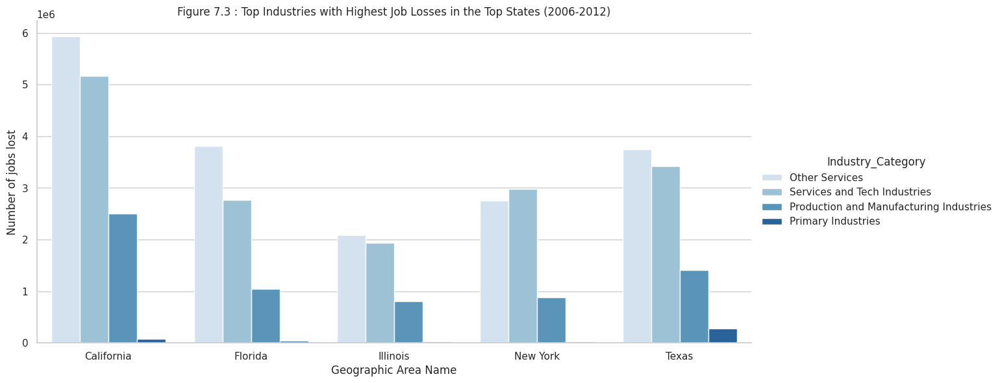

In [43]:
#Top Industries in the Top states which suffered heavy job loss during 2008 recession
df_industries = df_merged.copy()
df_industries = df_industries[(df_industries["Year"]>=2000)&(df_industries["Year"]<=2020)]

#Subsetting Sectors
primary_industries = ['Agriculture, forestry, fishing and hunting', 'Mining, quarrying, and oil and gas extraction', 'Utilities']
production_and_manufacturing = ['Construction', 'Manufacturing']
services_and_tech = ['Wholesale trade', 'Retail trade', 'Transportation and warehousing', 'Information', 'Finance and insurance', 'Health care and social assistance',]
other_services = [ 'Real estate and rental and leasing', 'Professional, scientific, and technical services', 'Management of companies and enterprises',
                             'Administrative and support and waste management and remediation services', 'Educational services', 'Arts, entertainment, and recreation',
                             'Accommodation and food services', 'Other services (except public administration)']

# Function to categorize sectors based on predefined lists
def categorizar_sector(sector):
    if sector in primary_industries:
        return 'Primary Industries'
    elif sector in production_and_manufacturing:
        return 'Production and Manufacturing Industries'
    elif sector in services_and_tech:
        return 'Services and Tech Industries'
    elif sector in other_services:
        return 'Other Services'
    else:
        return 'Others'

# Applying the sector categorization function to create a new column 'Industry_Category'
df_industries['Industry_Category'] = df_industries['Meaning of NAICS Code'].apply(categorizar_sector)

# Creating a copy of the DataFrame for job loss analysis, filtering by year and sectors
job_loss_state_sec=df_industries.copy()
job_loss_state_sec = job_loss_state_sec[(job_loss_state_sec["Year"] >= 2006) & (job_loss_state_sec["Year"] <= 2012)]
job_loss_state_sec = job_loss_state_sec[job_loss_state_sec["Meaning of NAICS Code"] != "Total for all sectors"]
job_loss_state_sec = job_loss_state_sec[job_loss_state_sec["Geographic Area Name"] != "United States"]

top_states = job_loss_state_sec.groupby('Geographic Area Name')['Number of jobs lost from contracting and closing establishments during the last 12 months'].sum().nlargest(5).index

top_states_data = job_loss_state_sec[job_loss_state_sec['Geographic Area Name'].isin(top_states)]

state_sector_job_losses = top_states_data.groupby(['Geographic Area Name',
                                                   'Industry_Category'])['Number of jobs lost from contracting and closing establishments during the last 12 months'].sum().reset_index()

top_5_industries = state_sector_job_losses.groupby('Geographic Area Name').apply(lambda x: x.nlargest(5, 'Number of jobs lost from contracting and closing establishments during the last 12 months'))
plt.figure(figsize=(12, 8));

# Creating a bar plot to visualize the top industries with the highest job losses in the top states
fig = sns.catplot(
    x='Geographic Area Name',
    y='Number of jobs lost from contracting and closing establishments during the last 12 months',
    hue='Industry_Category',
    data=top_5_industries,
    kind='bar',
    height=6,
    aspect=2,
    palette='Blues'
);

# Customizing plot labels and title
fig.set_xticklabels(rotation=0)
plt.xlabel('Geographic Area Name')
plt.ylabel('Number of jobs lost')
plt.title('Figure 7.3 : Top Industries with Highest Job Losses in the Top States (2006-2012)');


Figure 7.3 offers a revealing insight into the top industries that bore the brunt of job losses in the United States during the years 2006 to 2012. The data has been meticulously analyzed to focus on the states that suffered the most significant job losses, notably **California, Texas, Florida, New York, and Illinois**.

The graph vividly highlights the industries most severely affected by job losses in each of these states. Notably, the industries of Retail trade, Administrative, Professional services, Accommodation and Food Services, and Construction emerged as the top job loss sectors.

https://www.acorns.com/learn/investing/industries-most-affected-by-a-recession/#:~:text=Industries%20affected%20most%20include%20retail,have%20seen%20a%20monster%20rebound , verifies the finding



# **8. Analyzing the Rate of Firm Deaths (closures) across Sectors and the trailing effect on GDP across States.**

## 8.1 Understanding the correlation between Firm Deaths and GDP between 2000 and 2020



Moving forward, we're keen to see how the death of firms has affected the GDP on a highlevel. So by the end of this analysis we'll try to answer the following question

**Question -  What is the correlation between the death of firms and GDP?**
In other words, how is GDP affected by the death of firms over the years?

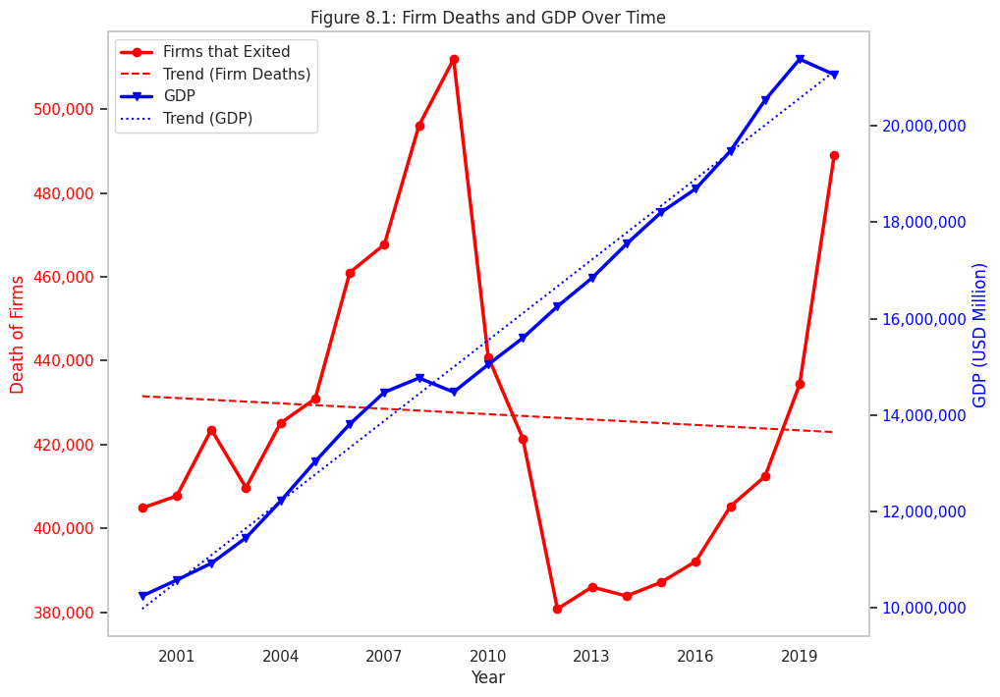

In [44]:
#Subset of Dataset
df_merged_us = df_merged[(df_merged["Year"]>=2000)&(df_merged["Year"]<=2020)]
df_merged_us = df_merged_us[df_merged_us["Geographic Area Name"] == "United States"]
df_merged_us = df_merged_us[df_merged_us["Meaning of NAICS Code"] == "Total for all sectors"]

# Sample data for firm deaths and GDP
years = df_merged_us['Year']
firm_deaths = df_merged_us['Number of firms that exited during the last 12 months']
gdp = df_merged_us['GDP']
fig, ax1 = plt.subplots(figsize=(10, 8))

# Ploting Number of firms that exited during the last 12 months
ax1.set_xlabel('Year')
ax1.set_ylabel('Death of Firms', color='#FF0000')
ax1.plot(years, firm_deaths, color='#FF0000', marker='o', label='Firms that Exited', linewidth=2.5)
ax1.tick_params(axis='y', labelcolor='#FF0000')

#Trend Analysis of Number of firms that exited during the last 12 months
slope_deaths, intercept_deaths, _, _, _ = linregress(years, firm_deaths)
trend_deaths = slope_deaths * years + intercept_deaths
ax1.plot(years, trend_deaths, linestyle='--', color='#FF0000', label='Trend (Firm Deaths)')

# Second y-axis to plot GDP
ax2 = ax1.twinx()
ax2.set_ylabel('GDP (USD Million)', color='blue')
ax2.plot(years, gdp, color='blue', marker='v', label='GDP', linewidth=2.5)
ax2.tick_params(axis='y', labelcolor='blue')


# Calculate and plot the trendline for GDP
slope_gdp, intercept_gdp, _, _, _ = linregress(years, gdp)
trend_gdp = slope_gdp * years + intercept_gdp
ax2.plot(years, trend_gdp, linestyle=':', color='blue', label='Trend (GDP)')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left')

# Add a title and labels
plt.title('Figure 8.1: Firm Deaths and GDP Over Time')
plt.xlabel('Year')
ax1.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
ax2.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

# Formating x-axis labels
for ax in axes.flat:

    ax1.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax1.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))
    ax2.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax2.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

# Display the plot
ax1.grid(False)
ax2.grid(False)
plt.show();


**Insights  from the lineplot**

The line plot we're looking at tells a compelling story of how business closures and the overall economic health of regions are intimately connected. In 2009, we see a peak in firm exits - **511,916** firms shut shop, perfectly timed with a noticeable **2%** dip in the Gross Domestic Product (GDP). A similar  pattern repeats in 2020. This synchronization between these two events underscores a strong relationship between economic downturns and the challenges businesses face.

The dip in GDP, a key indicator of a country's economic well-being, further highlights the impact. Conversely, during times of economic growth, businesses tend to thrive, and the number of closures decreases.


## 8.2  Understanding the correlation between Firm Deaths and Employees layoffs

Now, that we have understood that there is a correlation of the GDP and the death of firms, we are moving forward to find the relationship between firm closures and the number of employees fired.  We will try to answer the following question:

**Question -  What is the correlation between the death of firms and the number of employees layoffs?**

In [45]:
#Filter and group data for specific regions (South, West, Northeast, Midwest)

df_regions = df_merged[(df_merged["Year"]>=2000)&(df_merged["Year"]<=2020)]
df_South = df_regions[df_regions["Region"] == "South"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_West = df_regions[df_regions["Region"] == "West"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_Northeast = df_regions[df_regions["Region"] == "Northeast"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_Midwest = df_regions[df_regions["Region"] == "Midwest"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()

#Interactive chart settings
output_notebook()
fig = figure(x_axis_label=" Firms that Exited", y_axis_label="Number of employees associated with firm deaths", title="Figure 8.2: Firms that Exited")
fig.yaxis.formatter = NumeralTickFormatter(format='0,0')
fig.xaxis.formatter = NumeralTickFormatter(format='0,0')

# Creating ColumnDataSources for each region
df_South_source = ColumnDataSource(data=df_South)
df_West_source = ColumnDataSource(data=df_West)
df_Northeast_source = ColumnDataSource(data=df_Northeast)
df_Midwest_source = ColumnDataSource(data=df_Midwest)

# Creation of circles (glyphs) for each region
df_South_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="red", size=7, source=df_South_source)
df_West_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="green", size=7, source=df_West_source)
df_Northeast_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="yellow", size=7, source=df_Northeast_source)
df_Midwest_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="blue", size=7, source=df_Midwest_source)

#Initially, hide the glyphs of the regions except "South"
df_West_glyph.visible = False
df_Northeast_glyph.visible = False
df_Midwest_glyph.visible = False

#Settings dropdown menu to select the region to display
menu = ["South", "West", "Northeast", "Midwest"]
callback = CustomJS(args=dict(scatter1=df_South_glyph, scatter2=df_West_glyph, scatter3=df_Northeast_glyph, scatter4=df_Midwest_glyph),
                    code="""
                            scatter1.visible = true;
                            scatter2.visible = true;
                            scatter3.visible = true;
                            scatter4.visible = true;
                            if (this.value == "South") {
                                scatter2.visible = false;
                                scatter3.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "West") {
                                scatter1.visible = false;
                                scatter3.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "Northeast") {
                                scatter1.visible = false;
                                scatter2.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "Midwest") {
                                scatter1.visible = false;
                                scatter2.visible = false;
                                scatter3.visible = false;
                            }
                            """)
menu_select = Select(options=menu, value="South", title="Regions")
menu_select.js_on_change("value", callback)

#Show the design
layout = column(menu_select, fig)
show(layout);

In [48]:
# Filtering data
df_regions = df_merged[(df_merged["Year"] >= 2000) & (df_merged["Year"] <= 2020)]
df_South = df_regions[df_regions["Region"] == "South"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_West = df_regions[df_regions["Region"] == "West"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_Northeast = df_regions[df_regions["Region"] == "Northeast"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_Midwest = df_regions[df_regions["Region"] == "Midwest"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()

# Interactive chart settings
output_notebook()
fig = figure(x_axis_label="Firms that Exited", y_axis_label="Number of employees associated with firm deaths", title="Figure 8.2: Firms that Exited")
fig.yaxis.formatter = NumeralTickFormatter(format='0,0')
fig.xaxis.formatter = NumeralTickFormatter(format='0,0')

# Creating ColumnDataSources for each region
df_South_source = ColumnDataSource(data=df_South)
df_West_source = ColumnDataSource(data=df_West)
df_Northeast_source = ColumnDataSource(data=df_Northeast)
df_Midwest_source = ColumnDataSource(data=df_Midwest)

# Creation of circles (glyphs) for each region
df_South_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="red", size=7, source=df_South_source)
df_West_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="green", size=7, source=df_West_source)
df_Northeast_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="darkorange", size=7, source=df_Northeast_source)
df_Midwest_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="blue", size=7, source=df_Midwest_source)

# Initially, hide the glyphs of the regions except "South"
df_West_glyph.visible = False
df_Northeast_glyph.visible = False
df_Midwest_glyph.visible = False

# Settings dropdown menu to select the region to display
menu = ["All","South", "West", "Northeast", "Midwest"]
callback = CustomJS(args=dict(scatter1=df_South_glyph, scatter2=df_West_glyph, scatter3=df_Northeast_glyph, scatter4=df_Midwest_glyph),
                    code="""
                            scatter1.visible = true;
                            scatter2.visible = true;
                            scatter3.visible = true;
                            scatter4.visible = true;
                            if (this.value == "All") {
                              scatter1.visible = true
                              scatter2.visible = true
                              scatter3.visible = true
                              scatter4.visible = true
                            }
                            if (this.value == "South") {
                                scatter2.visible = false;
                                scatter3.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "West") {
                                scatter1.visible = false;
                                scatter3.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "Northeast") {
                                scatter1.visible = false;
                                scatter2.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "Midwest") {
                                scatter1.visible = false;
                                scatter2.visible = false;
                                scatter3.visible = false;
                            }
                            """)
menu_select = Select(options=menu, value="All", title="Regions")
menu_select.js_on_change("value", callback)

# Show the design
layout = column(menu_select, fig)
show(layout)


In [49]:
# Filtering data
df_regions = df_merged[(df_merged["Year"] >= 2000) & (df_merged["Year"] <= 2020)]
df_South = df_regions[df_regions["Region"] == "South"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_West = df_regions[df_regions["Region"] == "West"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_Northeast = df_regions[df_regions["Region"] == "Northeast"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()
df_Midwest = df_regions[df_regions["Region"] == "Midwest"].groupby(["Region", "Year"]).sum(numeric_only=True).reset_index()

# Interactive chart settings
output_notebook()
fig = figure(x_axis_label="Firms that Exited", y_axis_label="Number of employees associated with firm deaths", title="Figure 8.2: Firms that Exited")
fig.yaxis.formatter = NumeralTickFormatter(format='0,0')
fig.xaxis.formatter = NumeralTickFormatter(format='0,0')

# Creating ColumnDataSources for each region
df_South_source = ColumnDataSource(data=df_South)
df_West_source = ColumnDataSource(data=df_West)
df_Northeast_source = ColumnDataSource(data=df_Northeast)
df_Midwest_source = ColumnDataSource(data=df_Midwest)

# Creation of circles (glyphs) for each region with legends
df_South_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="red", size=7, source=df_South_source, legend_label="South")
df_West_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="green", size=7, source=df_West_source, legend_label="West")
df_Northeast_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="darkorange", size=7, source=df_Northeast_source, legend_label="Northeast")
df_Midwest_glyph = fig.circle(x="Number of firms that exited during the last 12 months", y="Number of employees associated with firm deaths during the last 12 months", color="blue", size=7, source=df_Midwest_source, legend_label="Midwest")

# Initially, hide the glyphs of the regions except "South"
df_West_glyph.visible = False
df_Northeast_glyph.visible = False
df_Midwest_glyph.visible = False

# Settings dropdown menu to select the region to display
menu = ["All", "South", "West", "Northeast", "Midwest"]
callback = CustomJS(args=dict(scatter1=df_South_glyph, scatter2=df_West_glyph, scatter3=df_Northeast_glyph, scatter4=df_Midwest_glyph),
                    code="""
                            scatter1.visible = true;
                            scatter2.visible = true;
                            scatter3.visible = true;
                            scatter4.visible = true;
                            if (this.value == "All") {
                              scatter1.visible = true
                              scatter2.visible = true
                              scatter3.visible = true
                              scatter4.visible = true
                            }
                            if (this.value == "South") {
                                scatter2.visible = false;
                                scatter3.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "West") {
                                scatter1.visible = false;
                                scatter3.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "Northeast") {
                                scatter1.visible = false;
                                scatter2.visible = false;
                                scatter4.visible = false;
                            } else if (this.value == "Midwest") {
                                scatter1.visible = false;
                                scatter2.visible = false;
                                scatter3.visible = false;
                            }
                            """)
menu_select = Select(options=menu, value="All", title="Regions")
menu_select.js_on_change("value", callback)

# Show the design with legends
fig.legend.title = "Regions"
layout = column(menu_select, fig)
show(layout)


In [ ]:
df_South.head()

**Insights  from the scatterplot**

This interactive chart provides a detailed look at regional economic dynamics in the United States by exploring the relationships between business closures and job losses. It allows for a direct comparison between four key regions: South, West, Northeast and Midwest. As we expected, it is validated that there is a positive relationship between the death of companies and employee layoffs, that is, if company closures increase, then the number of employee layoffs also increases.

## 8.3 Understanding the correlation between Firm Deaths and Employees layoffs

Finally, we are going to find out if there is any region that registers the highest percentage of firm closures during the evaluated period. We will try to answer the following question:

**Question - Which region is most likely to experience business closure?**

In [47]:
# Group data by region and year, adding the number of employees associated with business deaths and the total number of employees
df_grouped = df_regions.groupby(["Region", "Year"]).agg({"Number of employees associated with firm deaths during the last 12 months": "sum", "Number of employees": "sum"}).reset_index()

# Calculate the relative employee exit rate (percentage of employees who left) for each region
df_grouped["Relative Exits"] = df_grouped["Number of employees associated with firm deaths during the last 12 months"] / df_grouped["Number of employees"]

# Filter data for years between 2000 and 2020
df_grouped_filtered = df_grouped[(df_grouped["Year"] >= 2000) & (df_grouped["Year"] <= 2020)]

# Create a Bokeh Figure with Axis Labels and Title
output_notebook()
fig = figure(x_axis_label="Year", y_axis_label="Relative Employee layoffs (%)", title="Figure 8.3: Relative employees that Exited (2000-2020)", width=800, height=600)
fig.yaxis.formatter.use_scientific = False
fig.yaxis.formatter = NumeralTickFormatter(format='0.0%')

# Filter data for each region in the filtered DataFrame
df_South = df_grouped_filtered[df_grouped_filtered["Region"] == "South"]
df_West = df_grouped_filtered[df_grouped_filtered["Region"] == "West"]
df_Northeast = df_grouped_filtered[df_grouped_filtered["Region"] == "Northeast"]
df_Midwest = df_grouped_filtered[df_grouped_filtered["Region"] == "Midwest"]

# Create data sources for the lines of each region
df_South_source = ColumnDataSource(data=df_South)
df_West_source = ColumnDataSource(data=df_West)
df_Northeast_source = ColumnDataSource(data=df_Northeast)
df_Midwest_source = ColumnDataSource(data=df_Midwest)

# Draw lines for each region, setting colors and labels
df_South_glyphs = fig.line(x="Year", y="Relative Exits", color="red", source=df_South_source, line_width=2, legend_label="South")
df_West_glyphs = fig.line(x="Year", y="Relative Exits", color="green", source=df_West_source, line_width=2, legend_label="West")
df_Northeast_glyphs = fig.line(x="Year", y="Relative Exits", color="blue", source=df_Northeast_source, line_width=2, legend_label="Northeast")
df_Midwest_glyphs = fig.line(x="Year", y="Relative Exits", color="orange", source=df_Midwest_source, line_width=2, legend_label="Midwest")

# Create a JavaScript function to show or hide the lines based on the dropdown menu selection
callback = CustomJS(args=dict(line1=df_South_glyphs, line2=df_West_glyphs, line3=df_Northeast_glyphs, line4=df_Midwest_glyphs),
                    code="""
                            line1.visible = false;
                            line2.visible = false;
                            line3.visible = false;
                            line4.visible = false;

                            if (this.value == "All") {
                              line1.visible = true
                              line2.visible = true
                              line3.visible = true
                              line4.visible = true
                            }
                            if (this.value == "South") {
                                line1.visible = true ;
                            } else if (this.value == "West") {
                                line2.visible = true;
                            } else if (this.value == "Northeast") {
                                line3.visible = true;
                            } else if (this.value == "Midwest") {
                                line4.visible = true;
                            }
                            """)

# Create the dropdown menu
menu_select = Select(options=["All", "South", "West", "Northeast", "Midwest"], value="All", title="Region")
menu_select.js_on_change("value", callback)


# Show the design
layout = column(menu_select, fig)
show(layout)


**Insights from the lineplot**

As we explore this chart spanning the years from 2000 to 2020, a clear and concerning trend emerges – the West region consistently experiences the highest relative layoffs - **3.5% in 2002** and **3.3% in 2009**. This is a cause for concern, as it indicates the region's vulnerability to economic fluctuations and workforce challenges throughout this period.

Conversely, the Northeast and Midwest regions shine as beacons of stability and resilience. These regions maintain remarkably low levels of relative layoffs, signifying their robust and dependable employment environments.

While all regions do encounter synchronized spikes in the years 2002, 2009, and 2020, it is the West's persistently higher relative layoffs that stand out as a crucial insight. This chart, thus, not only portrays trends but also reveals a regional narrative, shedding light on the varying employment landscapes across the United States.

These insights not only provide a comprehensive understanding of regional economic dynamics but also emphasize the urgent need for targeted policies and interventions to bolster job security and promote economic stability, particularly in areas facing heightened employment uncertainties.

#9.How is Massachusetts fairing in all the aspects

Finally, Since we are in Massachusetts, we'd like to shed some light on how job volatality and per capita income are trending in this state.

In [ ]:
# Filter data to avoid United States and only include Massachusetts, Total for all sectors, and values from 2000 to 2020
df_filtered = df_merged[
    (df_merged['Meaning of NAICS Code'] == 'Total for all sectors') &
    (df_merged['Geographic Area Name'] != 'United States') &
    (df_merged['Year'] >= 2000) &
    (df_merged['Year'] <= 2020)
]

# The absolute value of net jobs created as a measure of job volatility
df_filtered['Job Volatility'] = df_filtered['Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months'].abs()

# The average job volatility and per capita personal income by state over the years
df_avg = df_filtered.groupby('Geographic Area Name')[['Job Volatility', 'Per capita personal income']].mean()

# Ranking states by job volatility and per capita personal income
df_avg['Volatility Rank'] = df_avg['Job Volatility'].rank(method='min', ascending=True)
df_avg['Income Rank'] = df_avg['Per capita personal income'].rank(method='min', ascending=False)

# Sort by job volatility rank and income rank
df_avg.sort_values(by=['Volatility Rank', 'Income Rank'], inplace=True)

# Find the rank of Massachusetts
massachusetts_rank = df_avg.loc['Massachusetts'][['Volatility Rank', 'Income Rank']]
print("[Massachusetts Ranks]")
print(f"Volatility Rank: {massachusetts_rank['Volatility Rank']}")
print(f"Income Rank: {massachusetts_rank['Income Rank']}")


In [42]:
df_avg['Volatility Rank'] = df_avg['Job Volatility'].rank(method='min', ascending=True)
df_avg['Income Rank'] = df_avg['Per capita personal income'].rank(method='min', ascending=False)
df_avg.sort_values(by=['Volatility Rank', 'Income Rank'], inplace=True)
df_avg

NameError: ignored

**Insights from the analysis**

Massachusetts is ranked **34** which implies that Jobs are relatively stable in MA.

Interms of Income Massachusetts is ranked **3rd** - implying that you can make more money by getting a job in Massachusetts relatively.

# Plotting Job Volatality and Per Capita Personal Income for the state of Massachusetts

In [ ]:
# Filter data to only include Massachusetts, Total for all sectors, and values from 2000 to 2020
df_massachusetts = df_merged[
    (df_merged['Meaning of NAICS Code'] == 'Total for all sectors') &
    (df_merged['Geographic Area Name'] == 'Massachusetts') &
    (df_merged['Year'] >= 2000) &
    (df_merged['Year'] <= 2020)
]

# Calculate the states with maximum & minimum Per Capita Personal Income
max_income_states = df_filtered.loc[df_filtered.groupby('Year')['Per capita personal income'].idxmax()]
min_income_states = df_filtered.loc[df_filtered.groupby('Year')['Per capita personal income'].idxmin()]

# Create subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Job volatility Plot
ax[0].plot(df_massachusetts['Year'], df_massachusetts['Number of net jobs created from expanding/contracting and opening/closing establishments during the last 12 months'], marker='o', color='b', label='Net Jobs Created')
ax[0].set_title('Figure 9.1: Job Volatility in Massachusetts (2000-2020)')
ax[0].set_xlabel('Year')
ax[0].set_ylabel('Net Jobs Created')
ax[0].get_yaxis().set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))
ax[0].grid(True)
ax[0].legend()

# Per capita personal income Plot
ax[1].plot(df_massachusetts['Year'], df_massachusetts['Per capita personal income'], marker='o', color='b', label='Massachusetts Per Capita Income')
ax[1].plot(max_income_states['Year'], max_income_states['Per capita personal income'], linestyle='--', color='g', label='Highest Per Capita Income')
ax[1].plot(min_income_states['Year'], min_income_states['Per capita personal income'], linestyle='--', color='r', label='Lowest Per Capita Income')
ax[1].set_title('Figure 9.2: Per Capita Personal Income in Massachusetts (2000-2020)')
ax[1].set_xlabel('Year')
ax[1].set_ylabel('Income ($)')
ax[1].get_yaxis().set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x)))
ax[1].grid(True)
ax[1].legend()

for ax in ax:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

plt.show()

**Insights from the subplots:**<br>

Figure 9.1:<br>
Over the past two decades, Massachusetts has witnessed noticeable variations in job volatility, with pronounced declines around 2008 and 2019. Despite these variations, the resilience of the state's job market is evident, as seen by recoveries after significant downturns. Among the 50 states, Massachusetts ranks 34th in job volatility. This indicates that while Massachusetts has encountered its share of challenges, a majority of states have experienced even more pronounced fluctuations in their job markets.

Figure 9.2:<br>
Concurrently, Massachusetts has witnessed a consistent upward trend in per capita personal income from 2000 to 2020. Even when compared with states having the highest and lowest incomes, Massachusetts consistently ranks closer to the top, securing the 3rd rank in income (Top 4%). This indicates a robust economic foundation, wherein, despite occasional job market challenges, the state has sustained a high standard of living for its residents.

# **10. Challenges**

This was a pretty interesting project to work on giving us insightful conclusions on current job market and trend. However it was definitely not a cake walk. We had faced a few challenges, which are as listed below:

1. **Data Collection and Quality:** The source data was dispersed, had missing values, and required extensive cleaning and transformation.

2. **Data Integration:** Merging data from multiple sources and ensuring consistency and compatibility was be complex.

3. **Interpreting Causation:** Correlation does not imply causation. While we found relationships between employment trends and economic factors, establishing causal links required a more extensive and challenging analysis.

5. **Economic Events:** Studying the effects of economic events on jobs was challenging due to the complexity of economic factors involved. Isolating the impact of specific events, like recessions, from other variables was very intricate.

6. **Lack of Historical Data:** Accessing historical data to understand long-term trends was limited, and this hindered the ability to make comprehensive conclusions about the relationships.

# **11. Conclusions**

**Decoding Two Decades: A Deep Dive into the US Economy (2000-2020)**

Our odyssey through the intricate terrain of the US economy over two transformative decades reveals an absorbing narrative marked by resilience, disparities, and the delicate equilibrium between economic health and prosperity.

Intriguingly, specific sectors emerged as the bellwethers of job volatility. Manufacturing, Administration Services, and Construction were not only the most capricious but also corroborated by quantitative data. Articles from trusted sources resonate with our findings, further emphasizing the profound flux in these domains.

Venturing back to the annals of history, the **2008 recession** looms large. This seismic event deeply impacted the job market. **California, Texas, Florida, New York, and Illinois** experienced the most pronounced setbacks. Numerically, these states collectively witnessed a staggering **~9 million** job losses. This revelation underscores the pivotal role that regional dynamics play in shaping job opportunities and economic resilience.

As we explore the narrative of layoffs and firm closures, a regional tableau unfolds. The West region surfaces as the most vulnerable, with a significant **20%** decrease in jobs. In stark contrast, the Midwest remains an epitome of stability, experiencing a mere **3%** decrease. This divergence can be attributed to the varying concentrations of industries within these regions. It is evident that geography and economics are intrinsically linked, with far-reaching implications.

Our exploration has unveiled a profound comprehension of the continuously evolving US economy. It tells a narrative that highlights the dynamic interplay between job market fluctuations, the oscillations within distinct sectors, and the impact of macroeconomic forces.

# **12. Point of View**

Based on our analysis, there are the suggestions we can offer to job seekers - especially students like us.

While finding a job in states like California, NewYork, Massachusetts, Connecticut and NewJersey has improved chances of making more money, targeting sectors like Agriculture, Utilities and Arts and Entertainment decreases the risk of losing jobs.

Note - This might not be conclusive as we have very less industry specific information in the fields of software.

# **12. Acknowledgments**

We would like to acknowledge the following  

1. ChatGPT from OpenAI for its assistance during the course of this project. ChatGPT aided us in three key instances:
* 		Plotting the Map Plot: ChatGPT provided guidance in understanding the approach to create and interpret map plots, enhancing the geographical aspect of our analysis.
* 		Highlighting Key Points: ChatGPT aided in highlighting the local maxima and minima an in our line graphs, making our insights more accessible and visually compelling.

* 		Graph Beautification: ChatGPT assisted in adjusting the formatting of float values for years on the X-axis, enhancing the clarity of several graphs.

2. Official documentation of Pandas, Numpy, Seaborn and Matplotlib for further clarification of functions/arguments.